<a href="https://colab.research.google.com/github/veroivega13/Proyecto_Final_Data_Science/blob/main/Data_StoryTelling(entrega)_VEGA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Campaña de marketing comercial de importante Tienda Minorista
 *** Análisis de respuesta de los clientes y predicción de compra de la membresía Gold***

**Contexto Comercial**: una Tienda grande está planeando una campaña de ventas de fin de año. Quieren lanzar una nueva oferta: una membresía dorada, que otorga un 20% de descuento en todas las compras, por sólo usd 499. Esa misma memebresía, habitualmente durante otros días, tiene un precio de usd 999.
Esta campaña será válida sólo para clientes existentes, y se está planificando realizarla a través de llamados telfónicos a ellos.
La Gerencia considera que la mejor manera de reducir el costo de la campaña es hacer un modelo predictivo que clasifique a los clientes que podrían comprar la oferta.

**Definición del objetivo**: predecir la probabilidad de que el cliente dé una respuesta positiva e identificar los diferentes factores que afectan la respuesta del cliente.


**Problema Comercial**:Se analizarán los datos proporcionados para identificar estos factores y luego construir un modelo de predicción para ver la probabilidad de que el cliente dé una respuesta positiva.
Los datos del Dataset fueron recopilados durante la campaña del año pasado.

**Contexto analítico:** Se me proporcionan los datos en un archivo CSV  (ubicado en un repositorio de Github, carpeta Data Science) con los detalles de los clientes existentes inscriptos en la Tienda desde 2012 al 2014 inclusive.


---



La pregunta concreta a responder sería:

*¿Cuál es el segmento de clientes existentes con mayor probabilidad de aceptar la oferta de la Campaña de la Tienda?*


---











**Tabla de Contenidos**


1. Presentación inicial del Dataset

  1.1 Análisis explotario inicial de datos

  1.2 Data wranling- Valores duplicados

2. Distribución de la Variable *Respuesta*

3.   Análisis demográfico de clientes
   
   3.1.   Edad
   
   3.2.  Estado Civil
   
   3.3.   Nivel de Educación

   3.4.   Ingresos

   3.5. Hijos

4. Comportamiento de Compra  

   4.1.   Compras realizadas por Canal y comportamiento digital

   4.2.   Gastos en diferentes categorías de producto

5. Variable tiempo

6. Análisis general de correlación entre variables

7.  Modelo Predictivo

   7.1.   Características relevantes

   7.2.   Modelo de predicción

8. Conclusiones






---



**1. Presentación inicial del Dataset**

Tal como se adelantó en la Introducción, los datos utilizados para el presente análisis y desarrollo, corresponden a clientes existentes de la tienda desde el año 2012 al 2014 inclusive. Se cuenta con datos demográficos de los clientes, tales como Estado Civil, Hijos, Nivel de Educación, Ingreso. Y al mismo tiempo, detalles del comportamiento de compras , ya sea por tipo de producto ( Vinos, Càrnicos, Pescados, Dulces), por canal de venta, descuentos , etc. Y como dato objetivo o variable target, se cuenta con la respuesta que han dado los clientes a la última Campaña de Marketing organizada por la tienda.

In [1]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

  Using cached https://github.com/pandas-profiling/pandas-profiling/archive/master.zip
  Preparing metadata (setup.py) ... done


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objects as go
import pandas_profiling

url ='https://raw.githubusercontent.com/veroivega13/datasciencie/main/superstore_data.csv'
df = pd.read_csv(url,index_col=0 )

df.head(10).style \
    .set_properties(**{'background-color': 'lightpurple',
                       'color': 'black',
                       'border-color': 'black',
                       'border-width': '3px',
                       'border-style': 'solid',
                       'text-align': 'center'}) \
    .set_table_styles([{'selector': 'th', 'props': [('background-color', 'lightgrey'),
                                                    ('color', 'black'),
                                                    ('border-color', 'black'),
                                                    ('border-width', '3px'),
                                                    ('border-style', 'solid'),
                                                    ('text-align', 'center')]},
                       {'selector': 'tr:nth-child(even)', 'props': [('background-color', 'violet')]}]).background_gradient(cmap='Purples')



<ipython-input-2-45382b7bd618>:9: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling


,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain
Id,,,,,,,,,,,,,,,,,,,,,
1826,1970,Graduation,Divorced,84835.000000,0,0,6/16/2014,0,189,104,379,111,189,218,1,4,4,6,1,1,0
1,1961,Graduation,Single,57091.000000,0,0,6/15/2014,0,464,5,64,7,0,37,1,7,3,7,5,1,0
10476,1958,Graduation,Married,67267.000000,0,1,5/13/2014,0,134,11,59,15,2,30,1,3,2,5,2,0,0
1386,1967,Graduation,Together,32474.000000,1,1,11/5/2014,0,10,0,1,0,0,0,1,1,0,2,7,0,0
5371,1989,Graduation,Single,21474.000000,1,0,8/4/2014,0,6,16,24,11,0,34,2,3,1,2,7,1,0
7348,1958,PhD,Single,71691.000000,0,0,3/17/2014,0,336,130,411,240,32,43,1,4,7,5,2,1,0
4073,1954,2n Cycle,Married,63564.000000,0,0,1/29/2014,0,769,80,252,15,34,65,1,10,10,7,6,1,0
1991,1967,Graduation,Together,44931.000000,0,1,1/18/2014,0,78,0,11,0,0,7,1,2,1,3,5,0,0
4047,1954,PhD,Married,65324.000000,0,1,11/1/2014,0,384,0,102,21,32,5,3,6,2,9,4,0,0


**1.1. Análisis exploratorio inicial de datos**

---



In [3]:
import pandas_profiling

In [4]:
!wget "link_to_font_files_download"
!unzip "download?family=font_file_name"

!mv font_file.ttf /usr/share/fonts/truetype/

!fc-cache -f -v

--2023-07-22 20:05:10--  http://link_to_font_files_download/
Resolving link_to_font_files_download (link_to_font_files_download)... failed: Name or service not known.
wget: unable to resolve host address ‘link_to_font_files_download’
unzip:  cannot find or open download?family=font_file_name, download?family=font_file_name.zip or download?family=font_file_name.ZIP.

No zipfiles found.
mv: cannot stat 'font_file.ttf': No such file or directory
/usr/share/fonts: caching, new cache contents: 0 fonts, 2 dirs
/usr/share/fonts/opentype: caching, new cache contents: 0 fonts, 2 dirs
/usr/share/fonts/opentype/font-awesome: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/opentype/mathjax: caching, new cache contents: 24 fonts, 0 dirs
/usr/share/fonts/truetype: caching, new cache contents: 0 fonts, 4 dirs
/usr/share/fonts/truetype/font-awesome: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/fonts/truetype/glyphicons: caching, new cache contents: 1 fonts, 0 dirs
/usr/share/f

In [5]:
!pip install --upgrade pip

!pip install --upgrade Pillow

In [6]:
profile=pandas_profiling.ProfileReport(df)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
# DETECCIÓN Y TRATAMIENTO DE VALORES DUPLICADOS
duplicates = df.duplicated()
num_duplicates = duplicates.sum()
duplicate_rows = df[duplicates]
print(num_duplicates)

182


In [8]:
df = df.drop_duplicates( keep='first')
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2058 entries, 1826 to 4070
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   Year_Birth           2058 non-null   int64  
 1   Education            2058 non-null   object 
 2   Marital_Status       2058 non-null   object 
 3   Income               2034 non-null   float64
 4   Kidhome              2058 non-null   int64  
 5   Teenhome             2058 non-null   int64  
 6   Dt_Customer          2058 non-null   object 
 7   Recency              2058 non-null   int64  
 8   MntWines             2058 non-null   int64  
 9   MntFruits            2058 non-null   int64  
 10  MntMeatProducts      2058 non-null   int64  
 11  MntFishProducts      2058 non-null   int64  
 12  MntSweetProducts     2058 non-null   int64  
 13  MntGoldProds         2058 non-null   int64  
 14  NumDealsPurchases    2058 non-null   int64  
 15  NumWebPurchases      2058 non-null 

In [9]:
df.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
Year_Birth,2058.0,1968.79,11.97,1893.0,1959.00,1970.0,1977.00,1996.0
Income,2034.0,52357.79,25526.96,1730.0,35528.25,51533.0,68480.75,666666.0
Kidhome,2058.0,0.45,0.54,0.0,0.00,0.0,1.00,2.0
Teenhome,2058.0,0.51,0.55,0.0,0.00,0.0,1.00,2.0
Recency,2058.0,48.95,29.00,0.0,24.00,49.0,74.00,99.0
MntWines,2058.0,303.92,336.53,0.0,23.00,174.0,504.00,1493.0
MntFruits,2058.0,26.23,39.75,0.0,1.00,8.0,33.00,199.0
MntMeatProducts,2058.0,167.70,228.30,0.0,16.00,67.0,229.50,1725.0
MntFishProducts,2058.0,37.33,54.66,0.0,3.00,12.0,50.00,259.0
MntSweetProducts,2058.0,27.18,41.71,0.0,1.00,8.0,33.75,263.0


**2. Distribución de la Variable Respuesta**

Como se puede observar claramente en los dos gráficos siguientes, sólo un 15% de los clientes ha aceptado positivamente la oferta de la tienda en la última campaña-

Esta distribución desbalanceada se deberá tener presente al momento de la aplicación del Modelo Predictivo.

In [10]:
# CANTIDAD DE 0 (respuesta negativa) y 1 ( respuesta positiva)
df['Response'].value_counts()

0    1745
1     313
Name: Response, dtype: int64

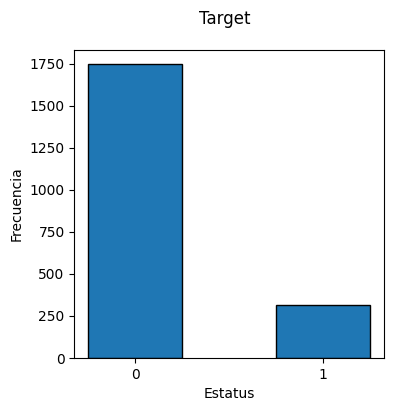

In [11]:
plt.figure(figsize = (4, 4))
plt.bar(df['Response'].value_counts().index,
        df['Response'].value_counts().values,width=0.5,edgecolor='black')
plt.suptitle('Target')
plt.xlabel('Estatus')
plt.ylabel('Frecuencia')
plt.xticks(df['Response'].unique())
plt.show()

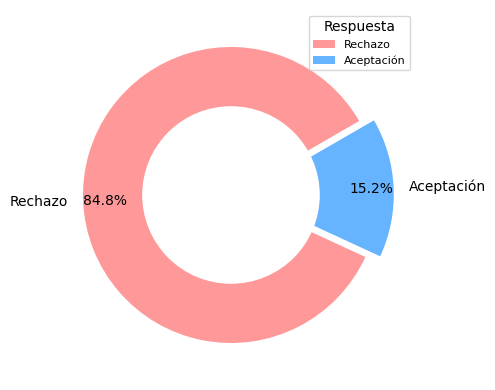

In [12]:
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
explode = (0.00,0.10)
labels = ['Rechazo','Aceptación']
plt.pie(df['Response'].value_counts(), colors = colors, labels=labels, autopct='%1.1f%%', startangle=30, pctdistance=0.85, explode = explode)

centre_circle = plt.Circle((0,0),0.60,fc='white')
fig = plt.gcf()
fig.set_size_inches(6, 4)
fig.gca().add_artist(centre_circle)

plt.legend(title = "Respuesta",prop={'size': 8})
plt.tight_layout()
plt.show()




---



**3. Análisis demográfico de los clientes**

  **3.1. Edad**

   Para un mejor análisis, se crea una columna de Edad de los clientes a partir de la fecha de nacimiento.


   Primero analizamos esta variable individualmente y luego hacemos un análisis bivariado con la target.

   Podemos observar que la Edad promedio de la cartera de clientes es de 54 años. Se observa un valor máximo de 130 años, que probablemente se deba a un error. Y la edad mínima es de 27 años.

   Los gráficos de distribución de las edades nos muestran una concentración entre el rango de 46 y 64 años. Se detectan tres valores sobre encima de los 120 años que serán eliminados (outliers).
   Respecto a la relación de las edades de los clientes con la respuesta positiva a la campaña, se observa en principio que no hay correlación fuerte o directa entre ambas variables. Si bien, la mayor cantidad de aceptación se da dentro del rango de edad de mayor concentración, no es directo y también se observan porcentajes de aceptación en las edades fuera del rango principal.

In [13]:
yr = 2023
df['Age'] = yr-df['Year_Birth']
df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])
df.head(5)

<ipython-input-13-78ca0bbd8983>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Age'] = yr-df['Year_Birth']
<ipython-input-13-78ca0bbd8983>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Dt_Customer'] = pd.to_datetime(df['Dt_Customer'])


,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain,Age
Id,,,,,,,,,,,,,,,,,,,,,
1826,1970,Graduation,Divorced,84835.0,0,0,2014-06-16,0,189,104,...,189,218,1,4,4,6,1,1,0,53
1,1961,Graduation,Single,57091.0,0,0,2014-06-15,0,464,5,...,0,37,1,7,3,7,5,1,0,62
10476,1958,Graduation,Married,67267.0,0,1,2014-05-13,0,134,11,...,2,30,1,3,2,5,2,0,0,65
1386,1967,Graduation,Together,32474.0,1,1,2014-11-05,0,10,0,...,0,0,1,1,0,2,7,0,0,56
5371,1989,Graduation,Single,21474.0,1,0,2014-08-04,0,6,16,...,0,34,2,3,1,2,7,1,0,34


In [14]:
df['Age'].describe()

count    2058.000000
mean       54.212828
std        11.973898
min        27.000000
25%        46.000000
50%        53.000000
75%        64.000000
max       130.000000
Name: Age, dtype: float64

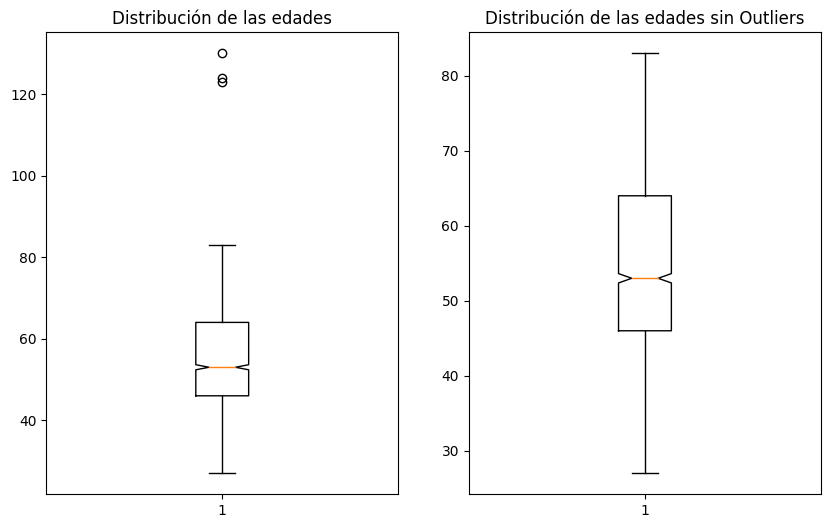

In [15]:
fig, axes = plt.subplots(ncols=2, nrows=1, sharex=False, sharey=False, figsize=(10,6))

axes[0].boxplot(df['Age'], notch=True)
axes[1].boxplot(df['Age'], notch=True, showfliers=False)

axes[0].set_title('Distribución de las edades')
axes[1].set_title('Distribución de las edades sin Outliers')


plt.show()

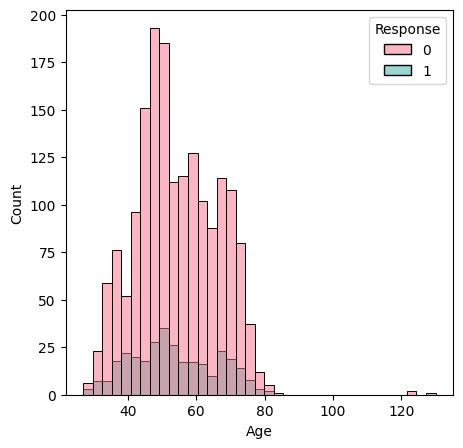

In [16]:
plt.figure(figsize = (5, 5))
sns.histplot(data = df, x = 'Age', hue='Response',palette='husl')
plt.show()

**3.2  Estado Civil**


En primer lugar, como dato interesante se ve que hay 2 clases de Estado Civil muy poco comunes o inexistentes que son: Absurd y YOLO (you only live once), y la categoría Alone que tampoco es frecuente. Si bien la cantidad de clientes con estas categorías es insignificante sobre el total, respecto de la variable Target (Response) se observa que el 50% aceptó a oferta y el 50% la rechazó. Con lo cual, considerando la similitud del tipo de categoría con Single, se ha decidido convertir a  clase Single esos tres tipos de estado civil Por otro lado, vemos que más del 50% de los clientes están Casados o "Juntados". Pero cuando cruzamos los datos de Estado Civil y target, vemos que no siguen la misma tendencia, en cuanto a que por ejemplo: los clientes Single representan menos del 50% de los Married. Sin embrago, han tenido mayor cantidad absoluta de respuestas positivas a la oferta que los Married ( 106 vs. 98). También en los Divorciados la proporción de respuestas positivas es mayor que en los "Juntados". Parecerìa entonces que no hay una relación lineal entre el Estado Civil y respuesta positiva. Sí se podría mencionar, en un primer análisis, que los Single o Divorced, en proporción, tienen mayor aceptación de la oferta.



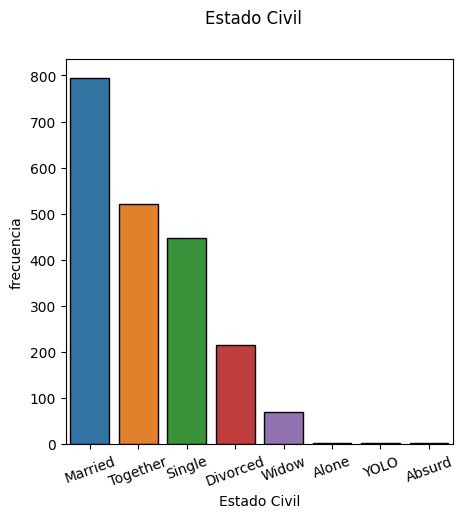

In [17]:
plt.figure(figsize = (5, 5))
sns.barplot(x = df['Marital_Status'].value_counts().index,
            y = df['Marital_Status'].value_counts().values,edgecolor='black')

plt.suptitle('Estado Civil')
plt.xlabel('Estado Civil')
plt.ylabel('frecuencia')
plt.xticks(rotation=20)

plt.show()

In [18]:
pd.crosstab(df['Response'],df['Marital_Status'])

Marital_Status,Absurd,Alone,Divorced,Married,Single,Together,Widow,YOLO
Response,,,,,,,,
0,1,2,173,703,347,466,52,1
1,1,1,43,92,101,55,19,1


In [19]:
# AGRUPACIÓN DE TIPOS DE CATEGORÌAS DENTRO DE LA VARIABLE ESTADO CIVIL
# Las categorías Alone, YOLO (You only live once) y Absurd que serían similares a Single, las reemplazaré por este valor Single, consierando que son pocos valores.


df['Marital_Status'].replace({'Alone': 'Single', 'YOLO': 'Single', 'Absurd': 'Single'}, inplace=True)

print(df['Marital_Status'].value_counts())


df.head(5)





Married     795
Together    521
Single      455
Divorced    216
Widow        71
Name: Marital_Status, dtype: int64


<ipython-input-19-89a4e179aaad>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Marital_Status'].replace({'Alone': 'Single', 'YOLO': 'Single', 'Absurd': 'Single'}, inplace=True)


,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain,Age
Id,,,,,,,,,,,,,,,,,,,,,
1826,1970,Graduation,Divorced,84835.0,0,0,2014-06-16,0,189,104,...,189,218,1,4,4,6,1,1,0,53
1,1961,Graduation,Single,57091.0,0,0,2014-06-15,0,464,5,...,0,37,1,7,3,7,5,1,0,62
10476,1958,Graduation,Married,67267.0,0,1,2014-05-13,0,134,11,...,2,30,1,3,2,5,2,0,0,65
1386,1967,Graduation,Together,32474.0,1,1,2014-11-05,0,10,0,...,0,0,1,1,0,2,7,0,0,56
5371,1989,Graduation,Single,21474.0,1,0,2014-08-04,0,6,16,...,0,34,2,3,1,2,7,1,0,34


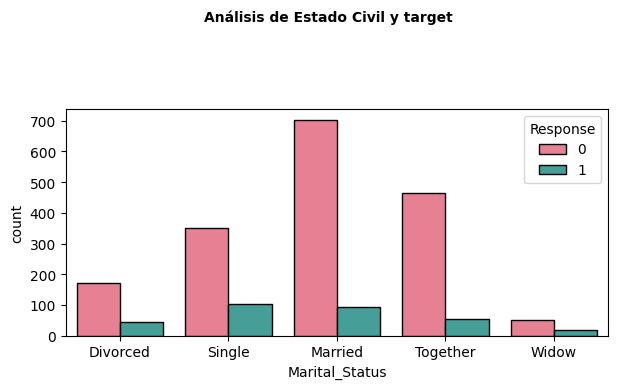

In [20]:

plt.figure(figsize = (7, 10))
plt.suptitle("Análisis de Estado Civil y target",fontweight="bold", fontsize=10)
plt.subplot(3,1,1)
sns.countplot(x = 'Marital_Status', hue = 'Response', palette = 'husl', data = df,edgecolor='black')
plt.show()

**3.3.  Nivel de Educación**


Este análisis muestra que aproximadamente el 50% de los clientes tienen nivel de Graduados ( que sería un paralelo de Nivel Secundario), y luego otro 35% aprox, de clientes tienen nivel de Doctorado o Master.

Respecto al nivel de Educación y la respuesta positiva a la oferta, tal como se ve en el gráfico bivariado, no se observa una correlación entre ambas variables.

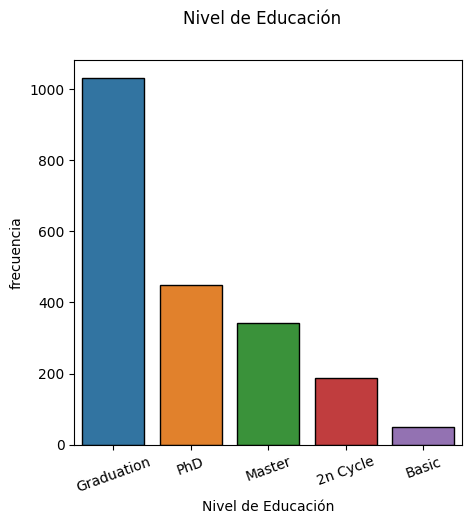

In [21]:

plt.figure(figsize = (5, 5))
sns.barplot(x = df['Education'].value_counts().index,
            y = df['Education'].value_counts().values,edgecolor='black')
plt.suptitle('Nivel de Educación')
plt.xlabel('Nivel de Educación')
plt.ylabel('frecuencia')
plt.xticks(rotation=20)

plt.show()

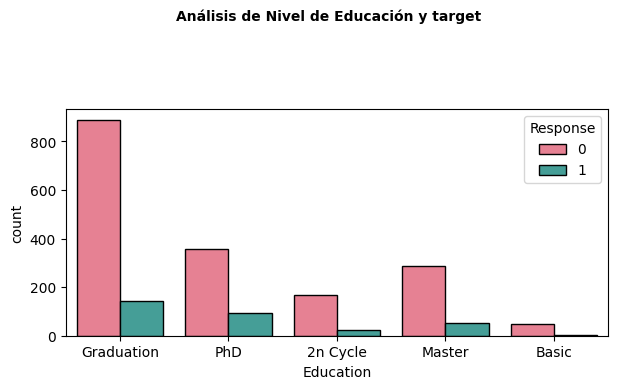

In [22]:
plt.figure(figsize = (7, 10))
plt.suptitle("Análisis de Nivel de Educación y target",fontweight="bold", fontsize=10)
plt.subplot(3,1,1)
sns.countplot(x = 'Education', hue = 'Response', palette = 'husl', data = df,edgecolor='black')
plt.show()

**3.4.   Ingresos**

En el análisis inicial de los datos, se detecta que en la columna Ingreso hay valores nulos.

Dado que el porcentaje de nulos no es importante (1.07 %), se decide reemplazarlos por la Mediana.

La media de Ingreso de los clientes es de usd 52.247 anuales. El 75% de los clientes tiene un ingreso de hasta usd 68.500 anuales. Hay un valor máximo outlier de usd 666.666 que puede corresponder en principio a un error ( por lo particular del número).

A primera vista, observando el gráfico bivariado Ingreso / Target, no se observa una correlación importante entre los ingresos de los clientes y la respuesta positiva a la oferta.

Si probamos analizar los ingresos respecto a la cantidad de  compras con descuento, tal como se ve en el gráfico de dispersión, vemos que **no** hay una correlación entre lo que podría ser, por ejemplo, mayor ingreso, menor cantidad de compras con descuentos, o de la misma forma, menor ingreso, mayor cantidad de compras con descuento.




In [23]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2058 entries, 1826 to 4070
Data columns (total 22 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   Year_Birth           2058 non-null   int64         
 1   Education            2058 non-null   object        
 2   Marital_Status       2058 non-null   object        
 3   Income               2034 non-null   float64       
 4   Kidhome              2058 non-null   int64         
 5   Teenhome             2058 non-null   int64         
 6   Dt_Customer          2058 non-null   datetime64[ns]
 7   Recency              2058 non-null   int64         
 8   MntWines             2058 non-null   int64         
 9   MntFruits            2058 non-null   int64         
 10  MntMeatProducts      2058 non-null   int64         
 11  MntFishProducts      2058 non-null   int64         
 12  MntSweetProducts     2058 non-null   int64         
 13  MntGoldProds         2058 non-

In [24]:
df['Income'].fillna(round(df['Income'].median()),inplace=True)
df['Income'] = df['Income'].astype('int64')


<ipython-input-24-9d761ee3d168>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Income'].fillna(round(df['Income'].median()),inplace=True)
<ipython-input-24-9d761ee3d168>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Income'] = df['Income'].astype('int64')


In [25]:
df['Income'].describe()

count      2058.000000
mean      52348.172983
std       25377.757029
min        1730.000000
25%       35701.750000
50%       51533.000000
75%       68242.500000
max      666666.000000
Name: Income, dtype: float64

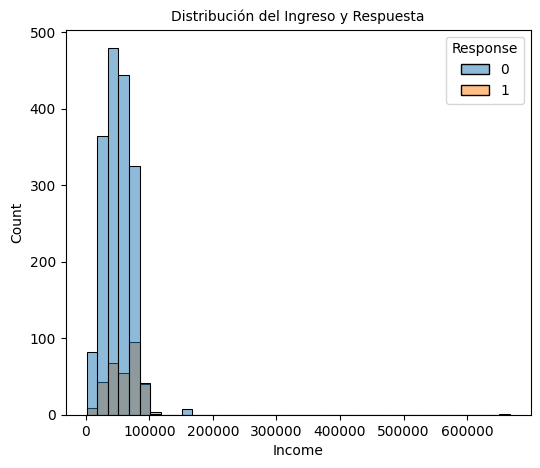

In [26]:

plt.figure(figsize = (6, 5))
sns.histplot(data = df, x = 'Income', hue='Response',bins=40)
plt.title('Distribución del Ingreso y Respuesta', fontsize = 10)
plt.show()

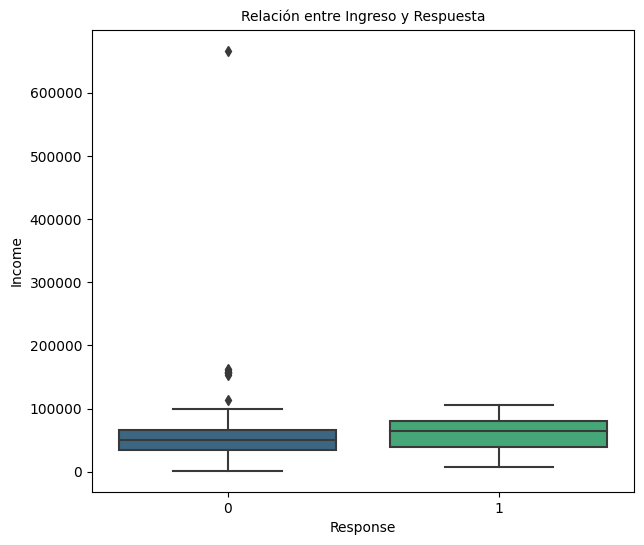

In [27]:
plt.rcParams['figure.figsize'] = (7, 6)
sns.boxplot(x=df['Response'], y=df['Income'], palette = 'viridis')
plt.title('Relación entre Ingreso y Respuesta', fontsize = 10)
plt.show()

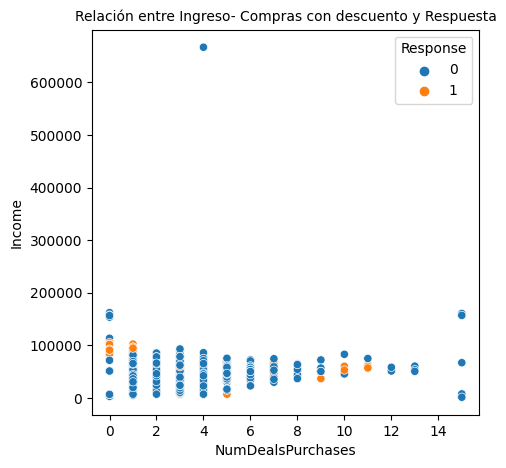

In [28]:

plt.figure(figsize = (5, 5))
sns.scatterplot( x='NumDealsPurchases',y='Income', data=df,hue='Response')
plt.title('Relación entre Ingreso- Compras con descuento y Respuesta', fontsize = 10)
plt.show()

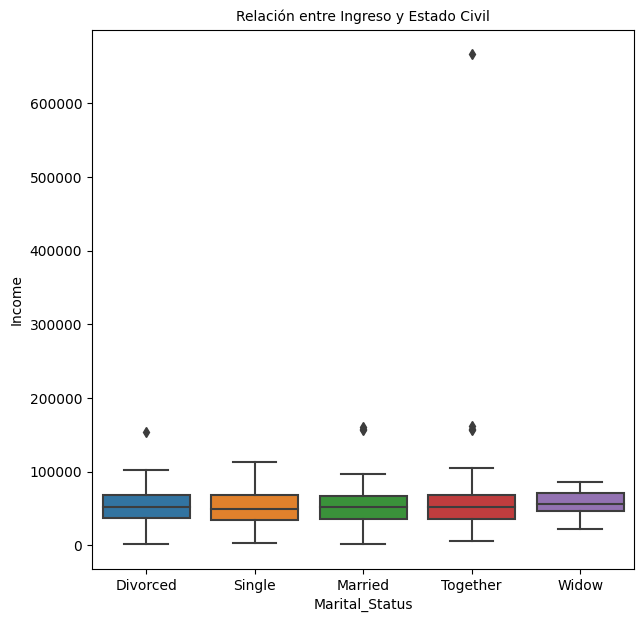

In [29]:

plt.figure(figsize=(7,7))
sns.boxplot(y = 'Income', x = 'Marital_Status', data = df)
plt.title('Relación entre Ingreso y Estado Civil', fontsize = 10)
plt.show()

Análisis de Ingreso vs productos consumidos  ==> 

Correlacion entre Ingreso y MntFruits ==>  0.41992985723336046


<ipython-input-30-deda3df546db>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Ingreso y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])


<Figure size 300x300 with 0 Axes>

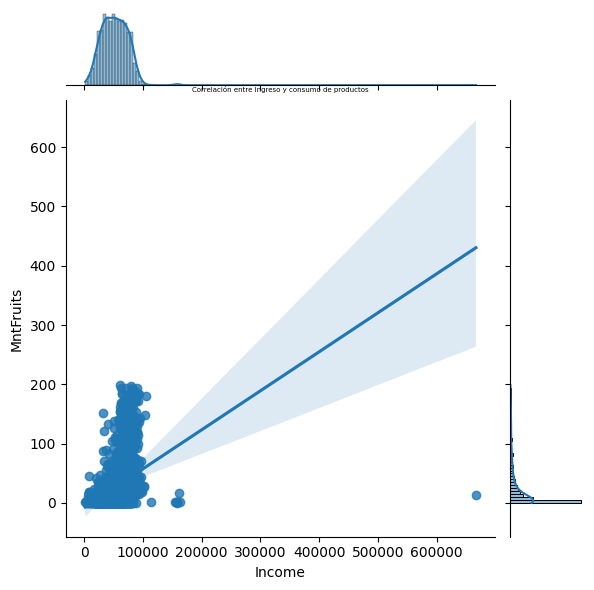

<ipython-input-30-deda3df546db>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Ingreso y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])


Correlacion entre Ingreso y MntMeatProducts ==>  0.5659474720649714


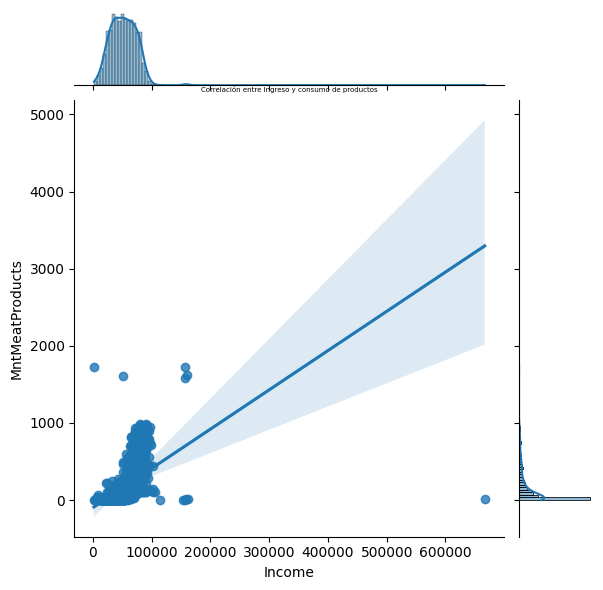

<ipython-input-30-deda3df546db>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Ingreso y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])


Correlacion entre Ingreso y MntFishProducts ==>  0.4284709424813111


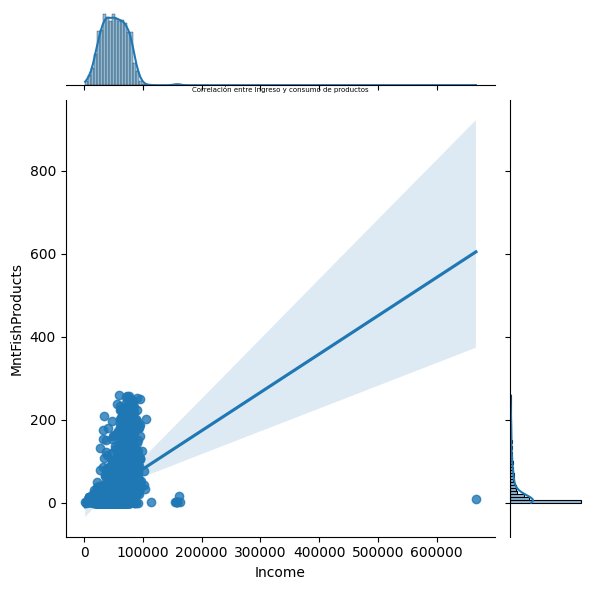

<ipython-input-30-deda3df546db>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Ingreso y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])


Correlacion entre Ingreso y MntGoldProds ==>  0.3074406953471775


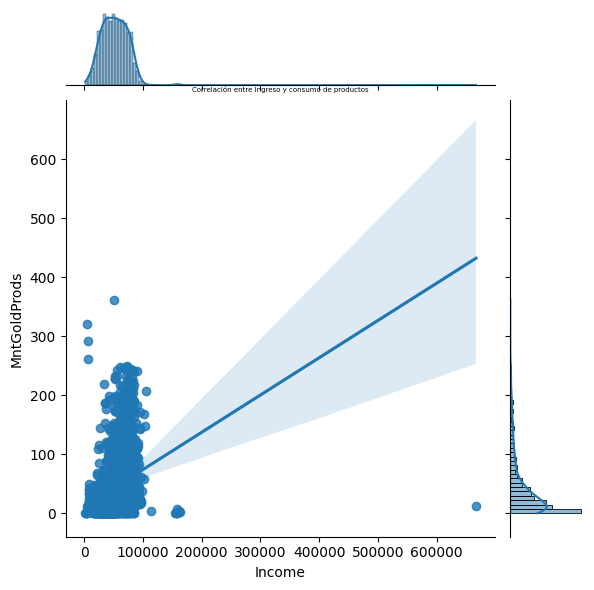

<ipython-input-30-deda3df546db>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Ingreso y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])


Correlacion entre Ingreso y MntWines ==>  0.5620097851042739


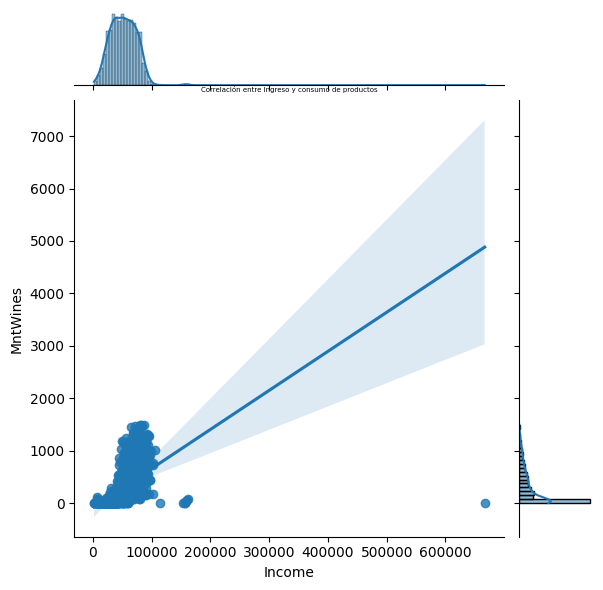

In [30]:
products_list=['Income','MntFruits','MntMeatProducts','MntFishProducts','MntGoldProds','MntWines','MntSweetProducts' ]
col = products_list
idx = col.index('Income')

plt.figure(dpi = 100, figsize = (3,3))
print("Análisis de Ingreso vs productos consumidos  ==> \n")
for i in  range(idx+1,len(col)-1):
    print(f"Correlacion entre Ingreso y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])
    sns.jointplot(x='Income',y=col[i],data=df,kind = 'reg',palette = "Blues_d")
    plt.title('Correlación entre Ingreso y consumo de productos', fontsize = 5)
    plt.show()



---



Análisis de relación Ingreso y canales de compras ==> 

Correlacion entre Income  y NumDealsPurchases ==>  -0.08202828170759993


<ipython-input-31-6a95acb707d5>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Income  y {col[i]} ==> ", df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])


<Figure size 500x400 with 0 Axes>

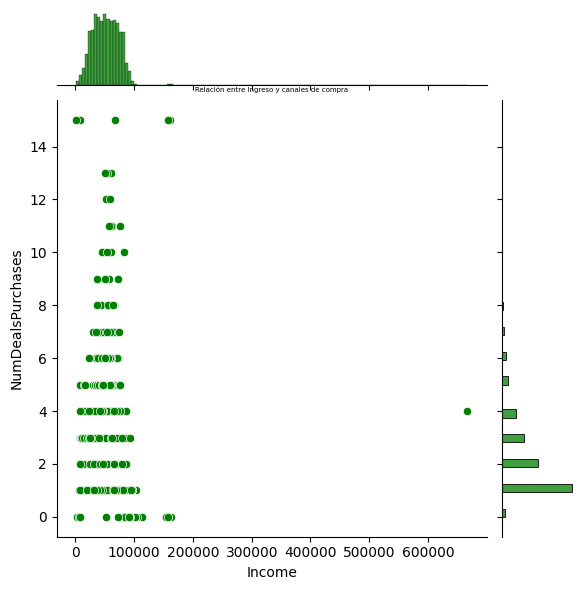

<ipython-input-31-6a95acb707d5>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Income  y {col[i]} ==> ", df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])


Correlacion entre Income  y NumWebPurchases ==>  0.365913384356949


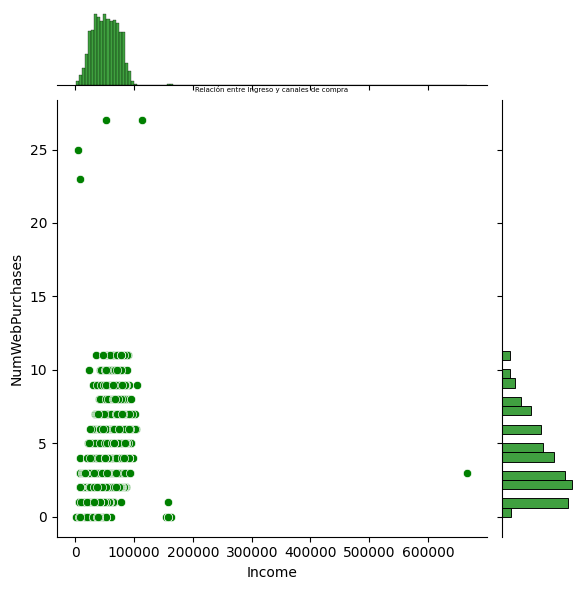

<ipython-input-31-6a95acb707d5>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Income  y {col[i]} ==> ", df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])


Correlacion entre Income  y NumCatalogPurchases ==>  0.5753486022609726


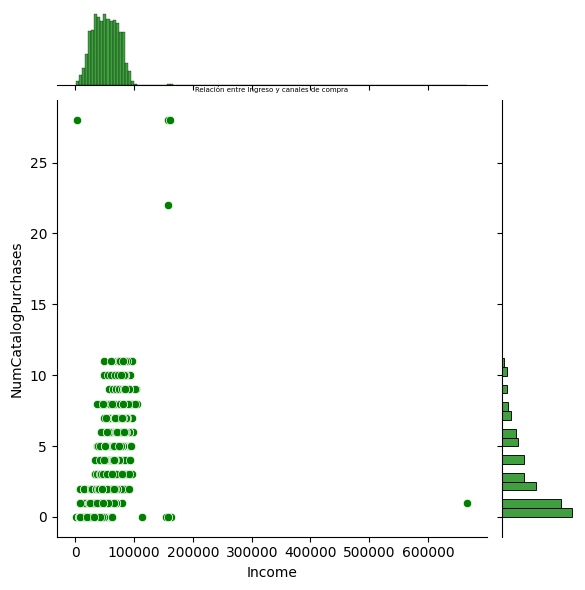

<ipython-input-31-6a95acb707d5>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Income  y {col[i]} ==> ", df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])


Correlacion entre Income  y NumStorePurchases ==>  0.5135081887438426


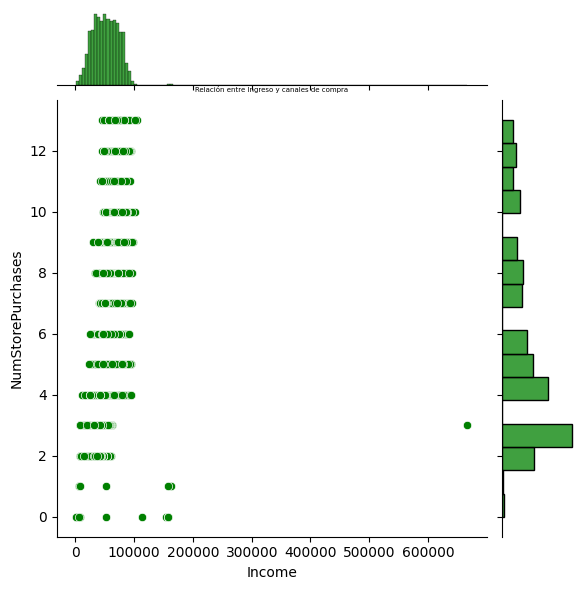

<ipython-input-31-6a95acb707d5>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Income  y {col[i]} ==> ", df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])


Correlacion entre Income  y NumWebVisitsMonth ==>  -0.5398508785955656


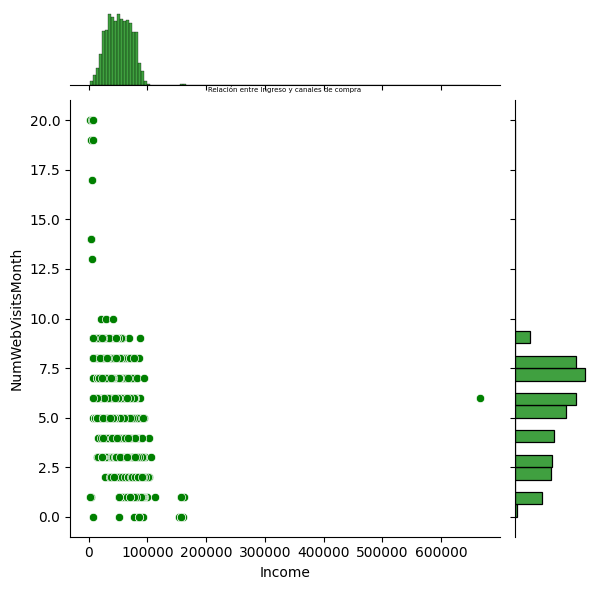

In [31]:

purchases_vars1 = ['Income', 'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth']
col = purchases_vars1
idx = col.index('Income')

plt.figure(dpi=100, figsize=(5, 4))
print("Análisis de relación Ingreso y canales de compras ==> \n")
for i in range(idx + 1, len(col)):
    print(f"Correlacion entre Income  y {col[i]} ==> ", df.select_dtypes(exclude=object).corr().loc['Income'][col[i]])
    sns.jointplot(x='Income', y=col[i], data=df, kind='scatter', color='green')
    plt.title('Relación entre Ingreso y canales de compra', fontsize=5)
    plt.show()


**3.5  Hijos**

Podemos ver que un 44% aprox. de los clientes tiene niños en casa y un 51% aprox. tiene adolescentes en casa.
Respecto a la relación de hijos en casa con la variable target, no se detecta una correlación directa entre hijos niños y aceptación o hijos adolescentes y aceptación de la oferta.
Si analizamos los gràficos de correlación entre hijos y consumo de productos y canales de compra, se pueden observar lo siguiente:
- Los clientes que tienen hijos pequeños en casa, consumirían menos productos en general, que los que no tienen niños en casa. Y comprarían menos a través web y catálogo, pero sí comprarían más (pequeña relación lineal positiva) con descuento.
- Respecto a los clientes con hijos adolescentes en casa, también hay una tendencia a consumir menos productos cárnicos, pescado, frutas, que los que no tienen hijos adolescentes. Pero respecto al producto vinos, parecería que cuantos más hijos adolescentes, se consume más alcohol. Respecto a los canales de compra, se puede ver que cuando hay adolescentes en la casa la tendencia es a realizar más compras con descuentos y vía web.

In [32]:
df[['Kidhome','Teenhome']].sum()


Kidhome      917
Teenhome    1048
dtype: int64

In [33]:
df[['Kidhome','Teenhome']].describe().round(2)

,Kidhome,Teenhome
count,2058.00,2058.00
mean,0.45,0.51
std,0.54,0.55
min,0.00,0.00
25%,0.00,0.00
50%,0.00,0.00
75%,1.00,1.00
max,2.00,2.00


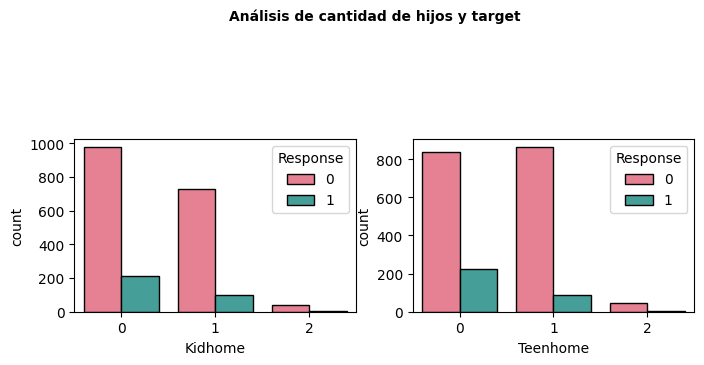

In [34]:
children_in_home = ['Kidhome','Teenhome']

plt.figure (figsize = (8, 13))
plt.suptitle("Análisis de cantidad de hijos y target",fontweight="bold", fontsize=10)
for i in range(len(children_in_home)):
    plt.subplot(5,2,i+1)
    sns.countplot(x = children_in_home[i], hue = 'Response', palette = 'husl', data = df,edgecolor='black')

Correlación entre Niños en casa y consumo de productos

Análisis de Niños en casa vs productos consumidos  ==> 

Correlacion entre Niños en casa y MntFruits ==>  -0.37209416877740914


<ipython-input-35-e74d54150c81>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Niños en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Kidhome'][col[i]])


<Figure size 500x500 with 0 Axes>

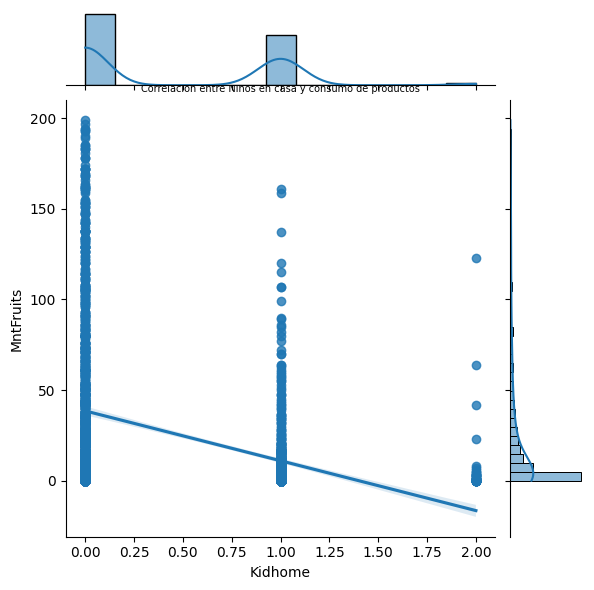

<ipython-input-35-e74d54150c81>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Niños en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Kidhome'][col[i]])


Correlacion entre Niños en casa y MntMeatProducts ==>  -0.4369473669036089


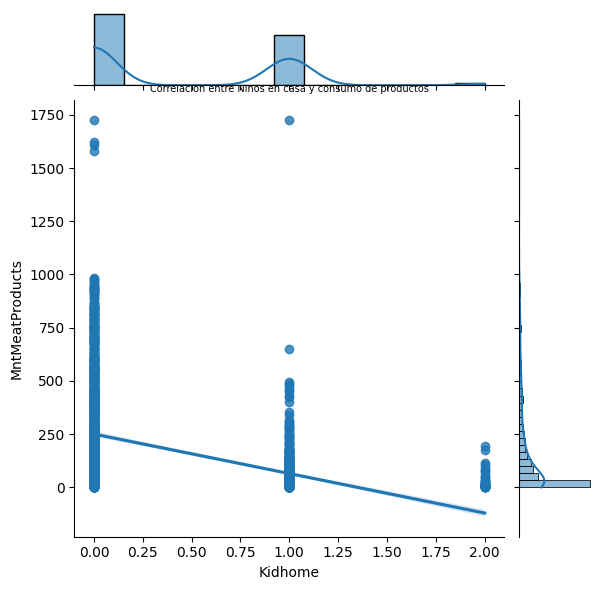

<ipython-input-35-e74d54150c81>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Niños en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Kidhome'][col[i]])


Correlacion entre Niños en casa y MntFishProducts ==>  -0.38703024279123394


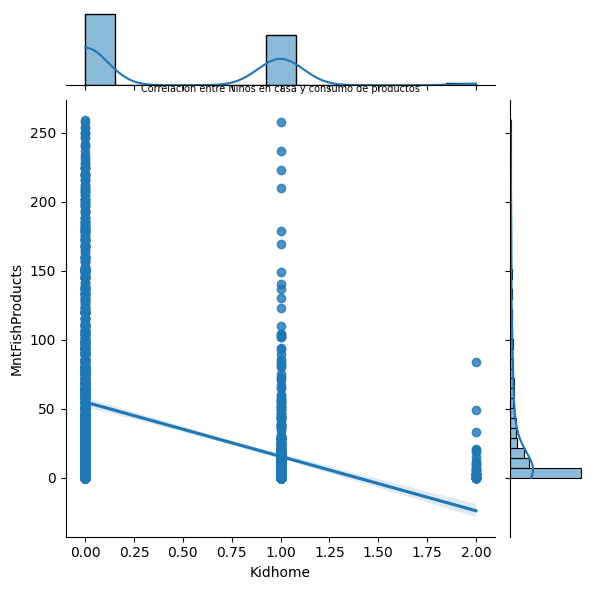

<ipython-input-35-e74d54150c81>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Niños en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Kidhome'][col[i]])


Correlacion entre Niños en casa y MntGoldProds ==>  -0.3452809307492404


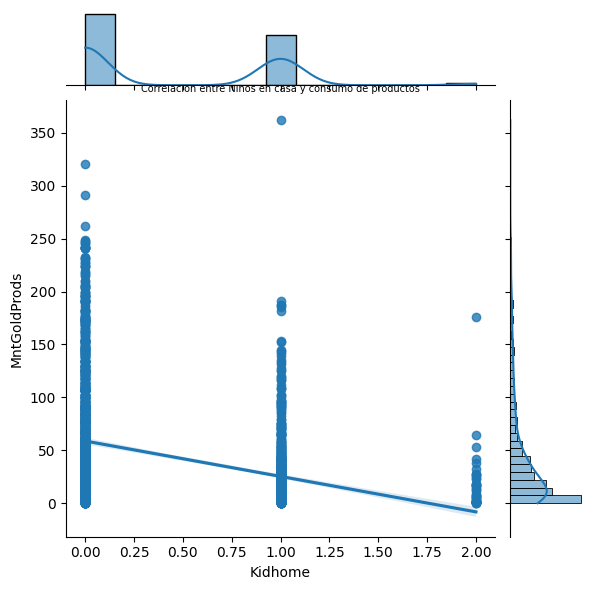

<ipython-input-35-e74d54150c81>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Niños en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Kidhome'][col[i]])


Correlacion entre Niños en casa y MntWines ==>  -0.5032560997522516


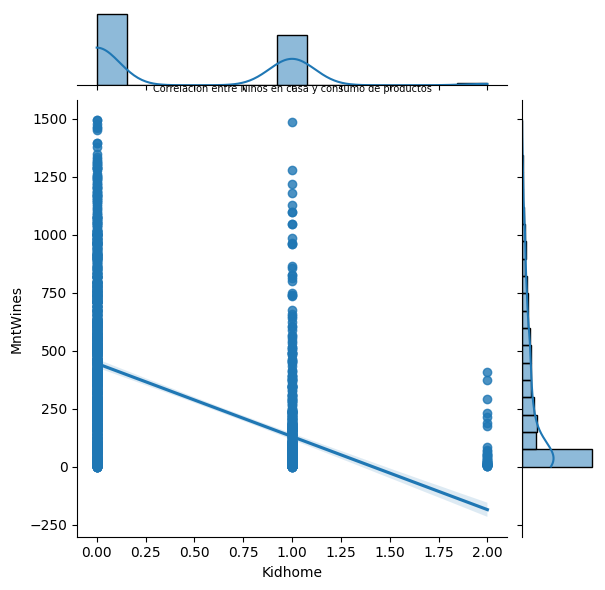

In [35]:
Kidhome_list=['Kidhome','MntFruits','MntMeatProducts','MntFishProducts','MntGoldProds','MntWines','MntSweetProducts' ]
col = Kidhome_list
idx = col.index('Kidhome')

plt.figure(dpi = 100, figsize = (5,5))
print("Análisis de Niños en casa vs productos consumidos  ==> \n")
for i in  range(idx+1,len(col)-1):
    print(f"Correlacion entre Niños en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Kidhome'][col[i]])
    sns.jointplot(x='Kidhome',y=col[i],data=df,kind = 'reg',palette = "Blues_d")
    plt.title('Correlación entre Niños en casa y consumo de productos', fontsize = 7)
    plt.show()

Correlación entre Adolescentes en casa y consumo de productos

Análisis de Adolescentes en casa vs productos consumidos  ==> 

Correlacion entre Adolescentes en casa y MntFruits ==>  -0.1784932263283102


<ipython-input-37-e00f310251c0>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Adolescentes en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Teenhome'][col[i]])


<Figure size 400x400 with 0 Axes>

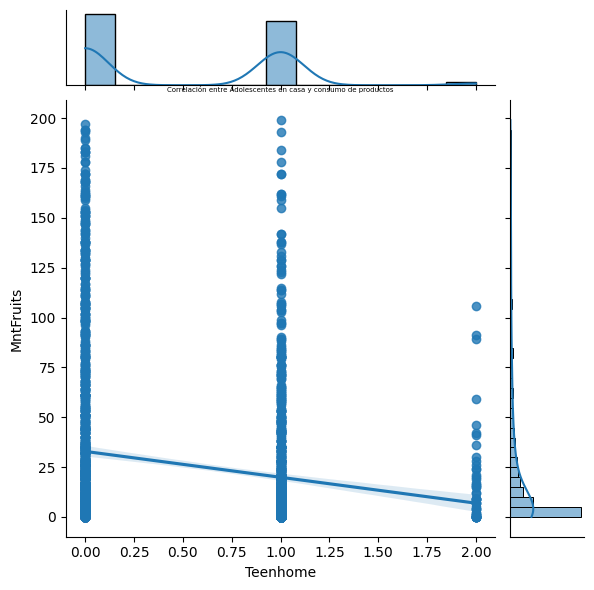

<ipython-input-37-e00f310251c0>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Adolescentes en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Teenhome'][col[i]])


Correlacion entre Adolescentes en casa y MntMeatProducts ==>  -0.26019248540791856


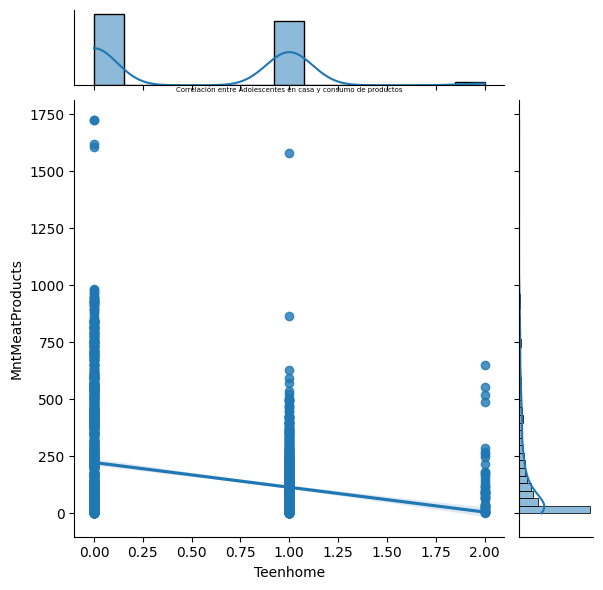

<ipython-input-37-e00f310251c0>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Adolescentes en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Teenhome'][col[i]])


Correlacion entre Adolescentes en casa y MntFishProducts ==>  -0.1970363655960245


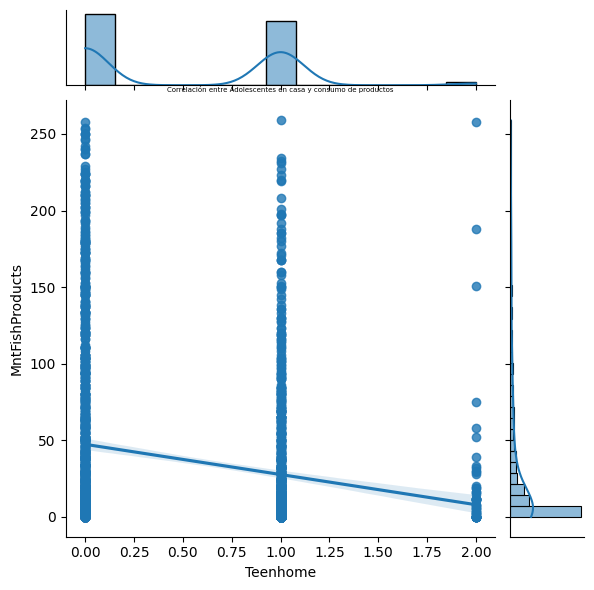

<ipython-input-37-e00f310251c0>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Adolescentes en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Teenhome'][col[i]])


Correlacion entre Adolescentes en casa y MntGoldProds ==>  -0.019166341740764224


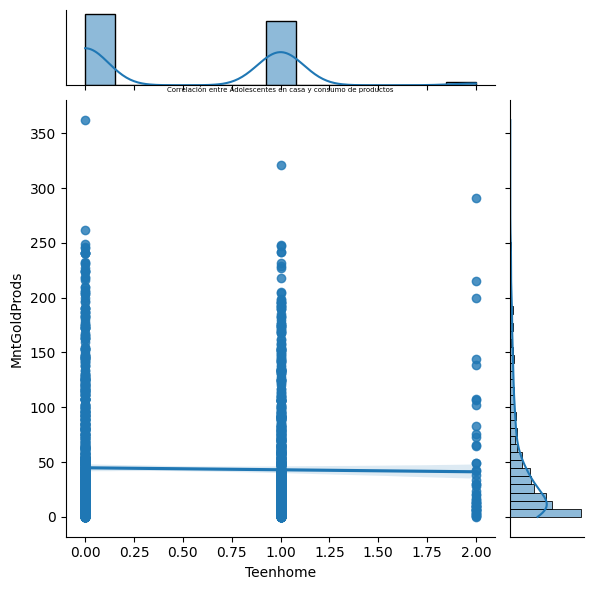

<ipython-input-37-e00f310251c0>:8: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Adolescentes en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Teenhome'][col[i]])


Correlacion entre Adolescentes en casa y MntWines ==>  0.006560875814988595


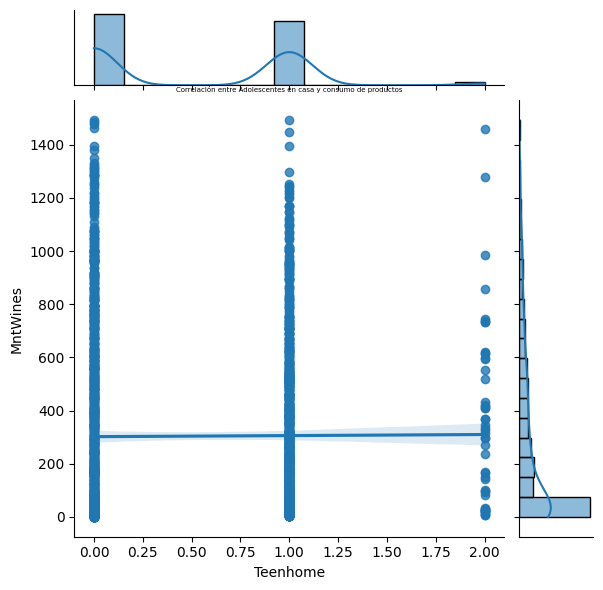

In [37]:
Teenhome_list=['Teenhome','MntFruits','MntMeatProducts','MntFishProducts','MntGoldProds','MntWines','MntSweetProducts' ]
col = Teenhome_list
idx = col.index('Teenhome')

plt.figure(dpi = 100, figsize = (4,4))
print("Análisis de Adolescentes en casa vs productos consumidos  ==> \n")
for i in  range(idx+1,len(col)-1):
    print(f"Correlacion entre Adolescentes en casa y {col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Teenhome'][col[i]])
    sns.jointplot(x='Teenhome',y=col[i],data=df,kind = 'reg',palette = "Blues_d")
    plt.title('Correlación entre Adolescentes en casa y consumo de productos', fontsize = 5)
    sns.despine()
    plt.show()

Correlación entre Niños en casa y canales de compra

Análisis de Niños en casa vs canales de compra  ==> 

Correlacion entre Niños en casa y canales de compraNumDealsPurchases ==>  0.21363902014460096


<ipython-input-191-e346e2111ef0>:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Niños en casa y canales de compra{col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Kidhome'][col[i]])


<Figure size 500x500 with 0 Axes>

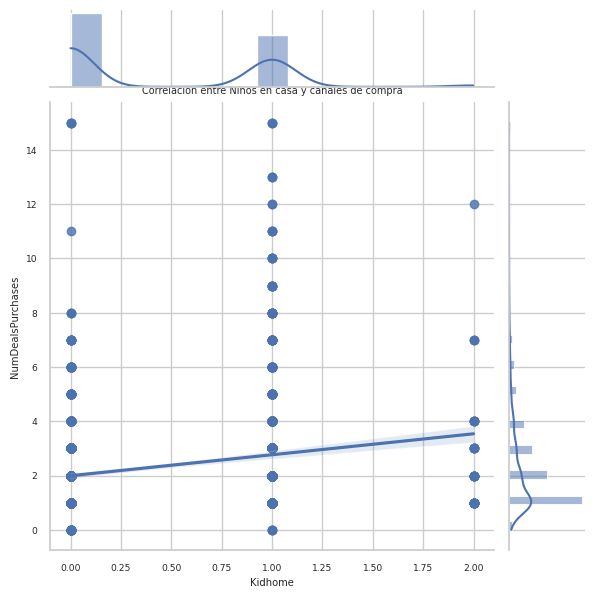

<ipython-input-191-e346e2111ef0>:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Niños en casa y canales de compra{col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Kidhome'][col[i]])


Correlacion entre Niños en casa y canales de compraNumWebPurchases ==>  -0.3670528971311049


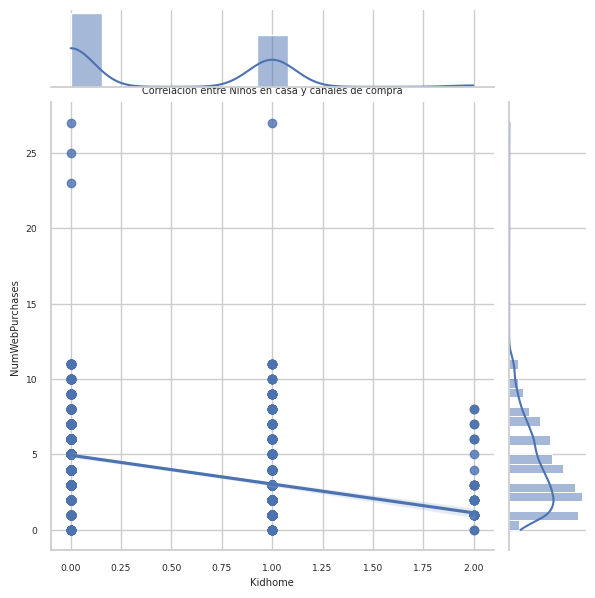

<ipython-input-191-e346e2111ef0>:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Niños en casa y canales de compra{col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Kidhome'][col[i]])


Correlacion entre Niños en casa y canales de compraNumCatalogPurchases ==>  -0.5009073375910245


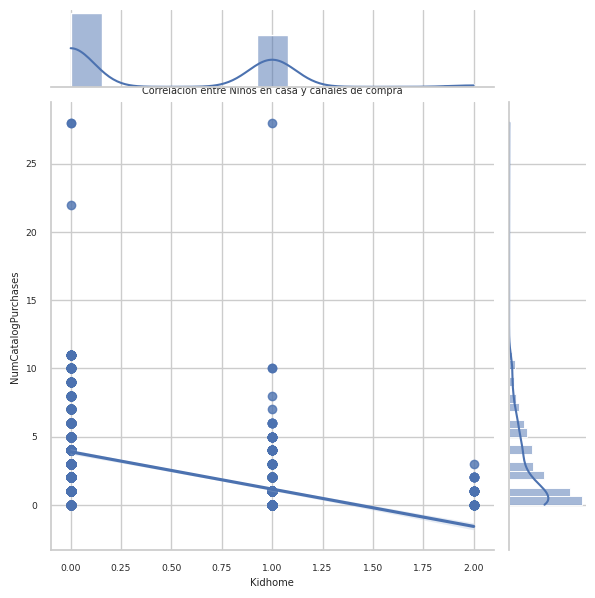

In [191]:
Kidhome_list2=['Kidhome', "NumDealsPurchases",'NumWebPurchases',"NumCatalogPurchases",
               "NumStorePurchases"]
col = Kidhome_list2
idx = col.index('Kidhome')

plt.figure(dpi = 100, figsize = (5,5))
print("Análisis de Niños en casa vs canales de compra  ==> \n")
for i in  range(idx+1,len(col)-1):
    print(f"Correlacion entre Niños en casa y canales de compra{col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Kidhome'][col[i]])
    sns.jointplot(x='Kidhome',y=col[i],data=df,kind = 'reg',palette = "Green")
    plt.title('Correlación entre Niños en casa y canales de compra', fontsize = 7)
    plt.show()

Análisis de Adolescentes en casa vs canales de compra

Análisis de Adolescentes en casa vs canales de compra  ==> 

Correlacion entre Adolescentes en casa y canales de compraNumDealsPurchases ==>  0.3766069822292476


<ipython-input-192-b01e17fad980>:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Adolescentes en casa y canales de compra{col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Teenhome'][col[i]])


<Figure size 500x500 with 0 Axes>

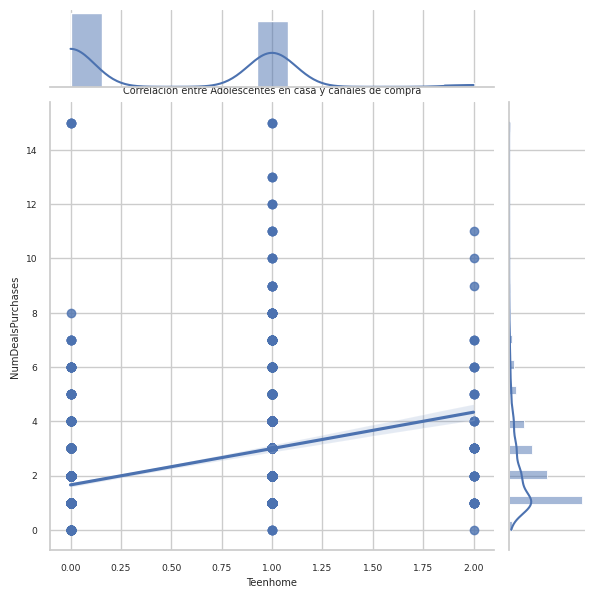

<ipython-input-192-b01e17fad980>:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Adolescentes en casa y canales de compra{col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Teenhome'][col[i]])


Correlacion entre Adolescentes en casa y canales de compraNumWebPurchases ==>  0.1471064850658798


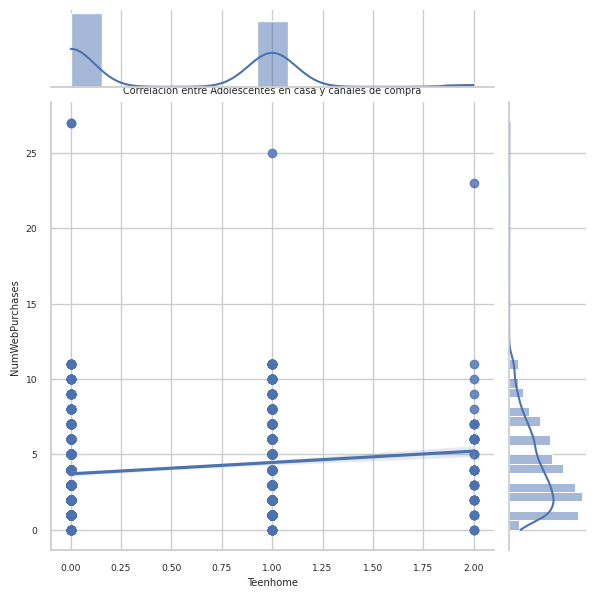

<ipython-input-192-b01e17fad980>:9: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  print(f"Correlacion entre Adolescentes en casa y canales de compra{col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Teenhome'][col[i]])


Correlacion entre Adolescentes en casa y canales de compraNumCatalogPurchases ==>  -0.10962895743321419


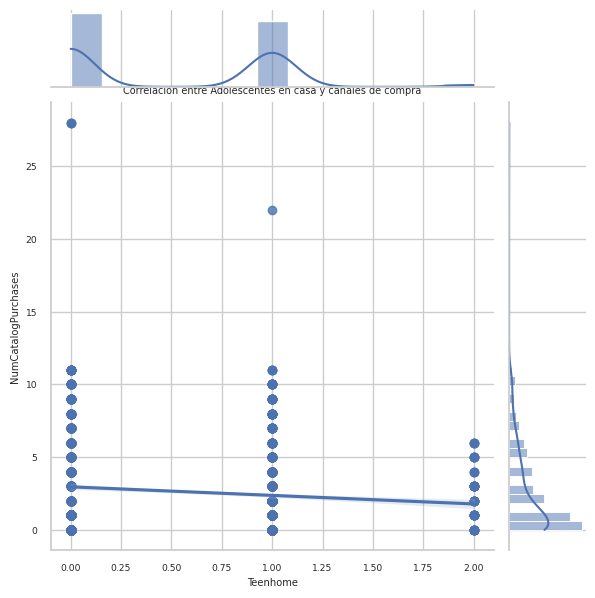

In [192]:
Teenhome_list2=['Teenhome', "NumDealsPurchases",'NumWebPurchases',"NumCatalogPurchases",
               "NumStorePurchases"]
col = Teenhome_list2
idx = col.index('Teenhome')

plt.figure(dpi = 100, figsize = (5,5))
print("Análisis de Adolescentes en casa vs canales de compra  ==> \n")
for i in  range(idx+1,len(col)-1):
    print(f"Correlacion entre Adolescentes en casa y canales de compra{col[i]} ==> ",df.select_dtypes(exclude=object).corr().loc['Teenhome'][col[i]])
    sns.jointplot(x='Teenhome',y=col[i],data=df,kind = 'reg',palette = "Green")
    plt.title('Correlación entre Adolescentes en casa y canales de compra',fontsize = 7)
    plt.show()

**4. Comportamiento de compras**

   4.1. Compras por canal:

   A través de los gráficos, se observa que la mayor cantidad de compras se da directamente en la  en la tienda directamente y en segundo lugar:  vía web.
   Respecto a la aceptación de la oferta, sí se observa una relación directa entre las compras con descuento y la respuesta positiva, y al mismo tiempo también se observa una relación proporcional entre las compras vía web y la aceptación de la oferta de la tienda.
   Por otro lado, podemos observar que la interacción de los clientes con la Tienda a través de la web es muy buena, el promedio de visitas a la web del último mes es de 5.3 por cliente y en la mayoría de estos casos, la aceptación de la oferta está por encima del 15% general. Con lo cual podríamos inferir que las visitas a la web de los cliente ayudan o incentivan a que tengan una mayor aceptación de la oferta ofrecida.

In [193]:
df[["NumDealsPurchases",'NumWebPurchases',"NumCatalogPurchases","NumStorePurchases"]].sum()

NumDealsPurchases       4814
NumWebPurchases         8435
NumCatalogPurchases     5476
NumStorePurchases      11876
dtype: int64

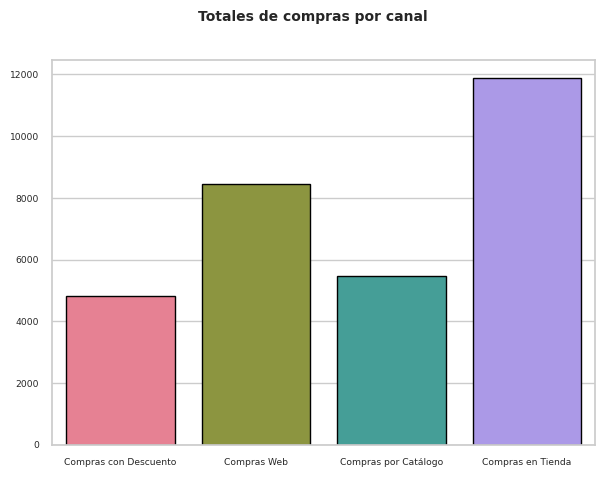

In [194]:


canal_list = ['Compras con Descuento','Compras Web', 'Compras por Catálogo', 'Compras en Tienda']

sum_columns = df[["NumDealsPurchases",'NumWebPurchases',"NumCatalogPurchases","NumStorePurchases"]].sum()
plt.figure(figsize=(7,5))
plt.suptitle("Totales de compras por canal ",fontweight="bold", fontsize=10)
sns.barplot(y=sum_columns, x=canal_list, palette='husl', data=df, edgecolor='black')

plt.show()



Index(['NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases'],
      dtype='object')


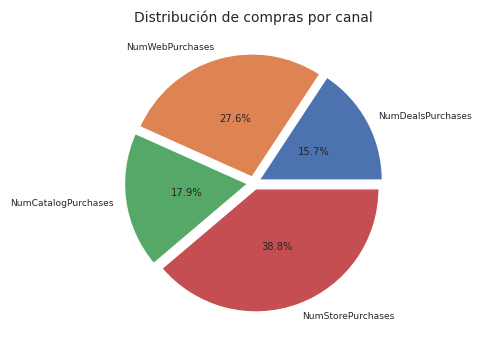

In [195]:

sum_columns = df[["NumDealsPurchases", "NumWebPurchases", "NumCatalogPurchases", "NumStorePurchases"]].sum()
labels = sum_columns.index
print(labels)

explode = [0.05] * len(sum_columns)
pie, ax = plt.subplots(figsize=[8,4])
plt.pie(x=sum_columns, autopct="%.1f%%", labels=labels, explode=explode, pctdistance=0.5)
plt.title("Distribución de compras por canal", fontsize=10)
plt.show()


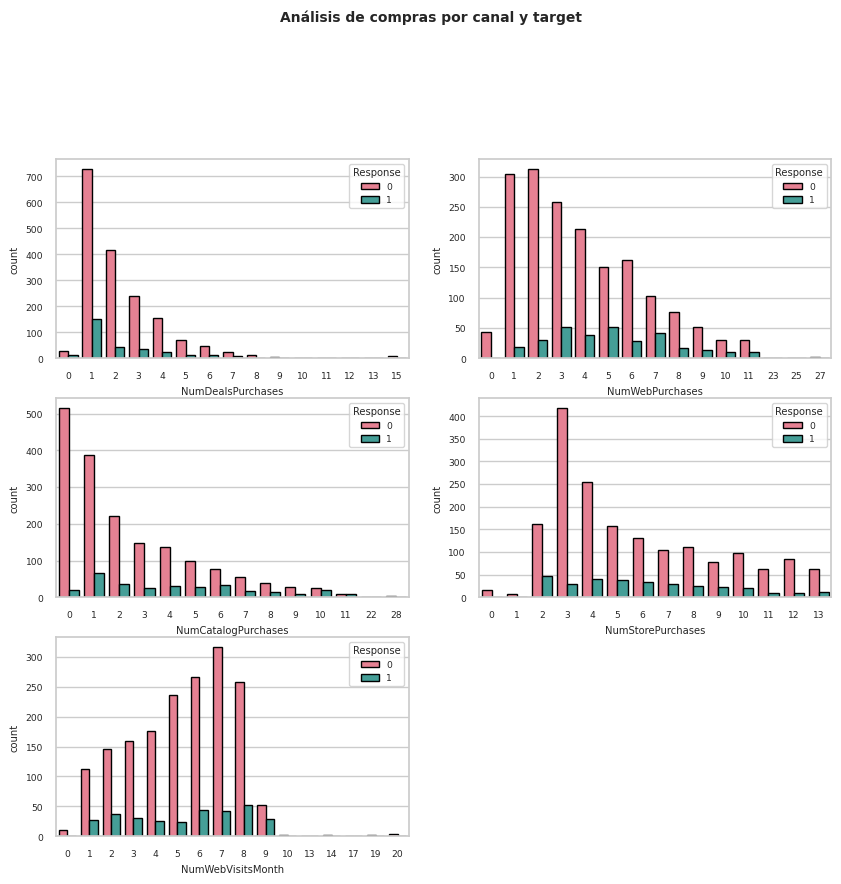

In [196]:
purchases_vars = ["NumDealsPurchases",'NumWebPurchases',"NumCatalogPurchases","NumStorePurchases","NumWebVisitsMonth"]

plt.figure (figsize = (10, 15))
plt.suptitle("Análisis de compras por canal y target",fontweight="bold", fontsize=10)
for i in range(len(purchases_vars)):
    plt.subplot(5,2,i+1)
    sns.countplot(x = purchases_vars[i], hue = 'Response', palette = 'husl', data = df,edgecolor='black')


In [197]:
df['NumWebVisitsMonth'].describe()

count    2058.000000
mean        5.319728
std         2.439907
min         0.000000
25%         3.000000
50%         6.000000
75%         7.000000
max        20.000000
Name: NumWebVisitsMonth, dtype: float64

4.2. Gastos en diferentes categorías de productos

En este punto, de lo expresado en los gráficos se puede observar que en todas las categorías de productos, los clientes que han aceptado la oferta última, han gastado o consumido más. Esta tendencia es clara, y se da con más fuerza en los porductos: Vinos y Carnes.
Podríamos hacer una primera conclusión que a mayor gasto, mayor aceptación de la oferta.

Al mismo tiempo, en el segundo gráfico se observa el consumo total por producto en los últimos 2 años, y se destacan claramente como los más consumidos, los productos: VINOS y CARNES.

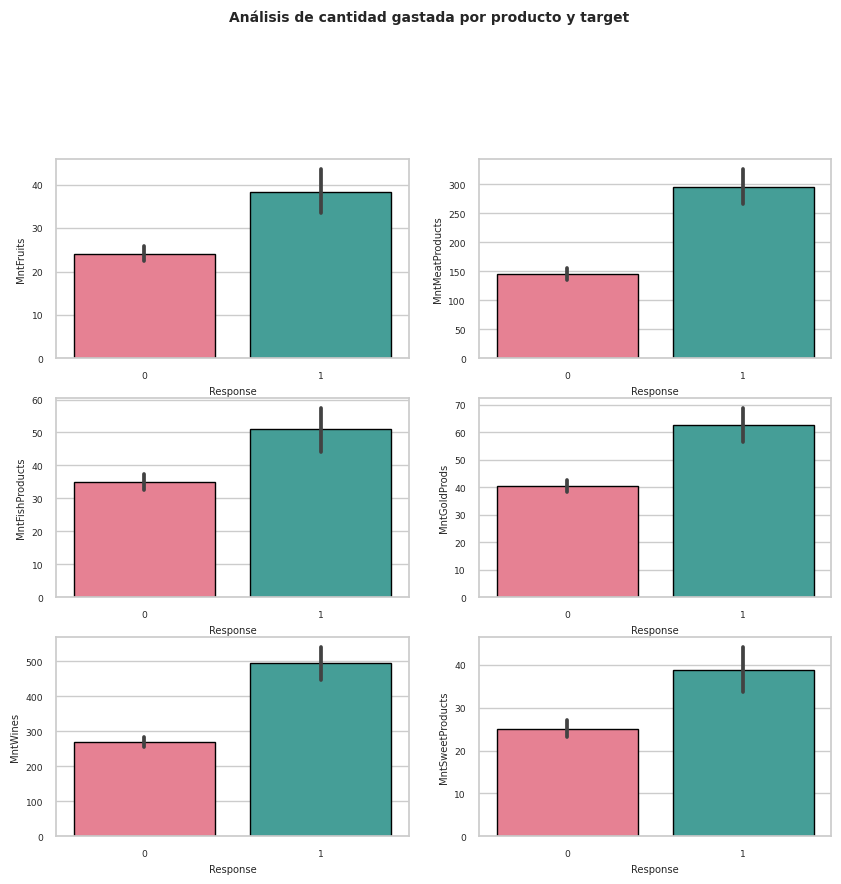

In [198]:
products_list=['MntFruits','MntMeatProducts','MntFishProducts','MntGoldProds','MntWines','MntSweetProducts' ]

plt.figure(figsize = (10, 15))
plt.suptitle("Análisis de cantidad gastada por producto y target ",fontweight="bold", fontsize=10)
for i in range(len(products_list)):
    plt.subplot(5,2,i+1)
    sns.barplot(y =products_list[i], x = 'Response' ,  palette = 'husl', data = df,edgecolor='black')

In [199]:
df[['MntFruits','MntMeatProducts','MntFishProducts','MntGoldProds','MntWines','MntSweetProducts']].sum()


MntFruits            53991
MntMeatProducts     345136
MntFishProducts      76824
MntGoldProds         90291
MntWines            625471
MntSweetProducts     55930
dtype: int64

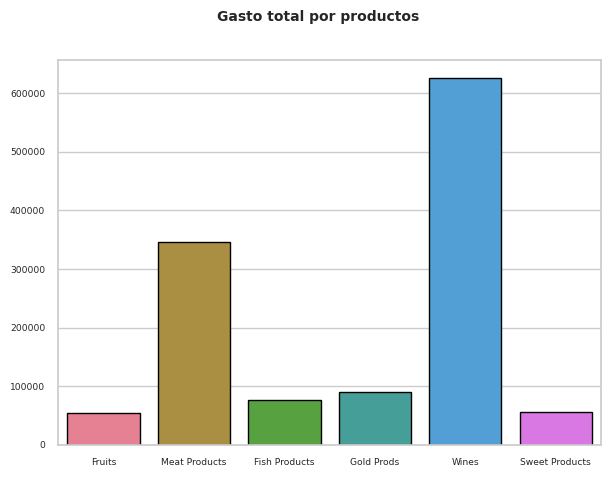

In [200]:


products_list = ['Fruits', 'Meat Products', 'Fish Products', 'Gold Prods', 'Wines', 'Sweet Products']

sum_columns = df[['MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntGoldProds', 'MntWines', 'MntSweetProducts']].sum()
plt.figure(figsize=(7,5))
plt.suptitle("Gasto total por productos ",fontweight="bold", fontsize=10)
sns.barplot(y=sum_columns, x=products_list, palette='husl', data=df, edgecolor='black')
plt.show()





---



**5. Variable tiempo**

En este punto analizaremos la antiguedad de los clientes de la tienda considerando que tenemos sólo 3 años de datos: 2012, 2013 y 2014.
La mayor cantidad de ingreso de clientes se ha dado claramente en el año 2013, duplicando la cantidad de clientes de los otros años bajo análisis.

Respecto al comprotamiento del cliente con la oferta ofrecida, se observa que en proporción, los más antiguos, es decir, los clientes inscriptos en el 2012 tienen mayor porcentaje de aceptación comparado con los otros años.



<ipython-input-201-d7c5ed98dfc1>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Enroll_Year"]=pd.to_datetime(df["Dt_Customer"]).dt.year
<ipython-input-201-d7c5ed98dfc1>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Enroll_Year"] = df["Enroll_Year"].astype("int64")


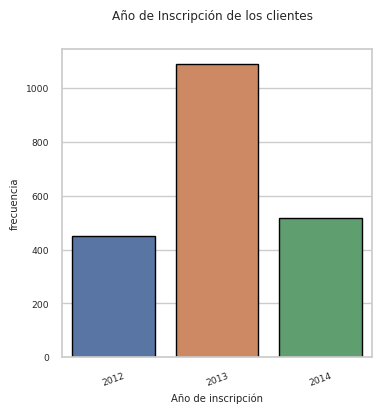

In [201]:
df["Enroll_Year"]=pd.to_datetime(df["Dt_Customer"]).dt.year
df["Enroll_Year"] = df["Enroll_Year"].astype("int64")
plt.figure(figsize=(4,4))
sns.barplot(x = df['Enroll_Year'].value_counts().index,
            y = df['Enroll_Year'].value_counts().values,edgecolor='black')
plt.suptitle('Año de Inscripción de los clientes')
plt.xlabel('Año de inscripción')
plt.ylabel('frecuencia')
plt.xticks(rotation=20)
plt.show()



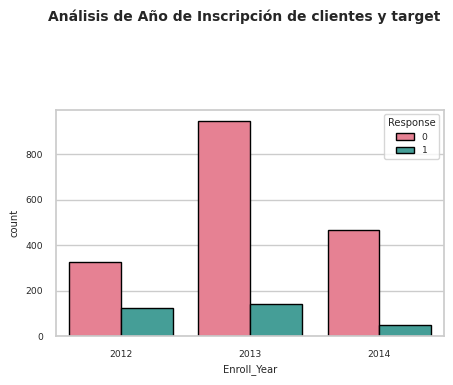

In [202]:
plt.figure(figsize = (5, 10))
plt.suptitle("Análisis de Año de Inscripción de clientes y target",fontweight="bold", fontsize=10)
plt.subplot(3,1,1)
sns.countplot(x = 'Enroll_Year', hue = 'Response', palette = 'husl', data = df,edgecolor='black')
plt.show()



---



**6. Análisis general de correlación entre variables**


Para hacer un análisis más específico de las correlaciones de nuestro Df , podemos aplicar el método df.corr con las variables numéricas inicialmente.

In [203]:
df.select_dtypes(exclude=object).corr().round(2)["Response"].sort_values(ascending=False)


<ipython-input-203-0ae2c9727df8>:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df.select_dtypes(exclude=object).corr().round(2)["Response"].sort_values(ascending=False)


Response               1.00
MntWines               0.24
MntMeatProducts        0.24
NumCatalogPurchases    0.22
MntGoldProds           0.15
NumWebPurchases        0.15
MntFruits              0.13
Income                 0.13
MntSweetProducts       0.12
MntFishProducts        0.11
NumStorePurchases      0.04
Year_Birth             0.03
NumDealsPurchases     -0.00
NumWebVisitsMonth     -0.00
Complain              -0.00
Age                   -0.03
Kidhome               -0.08
Teenhome              -0.16
Enroll_Year           -0.17
Recency               -0.20
Name: Response, dtype: float64

Como vimos al inicio, al tener una variable target tan desbalanceada con sólo un 15% de valores 1 (positivos), es más dificultoso encontrar correlaciones, tal como se muestra en este último análisis, en el cual ninguna variable numérica supera el 0.25, ni positiva ni negativa.
Considero que hay que seguir las correlaciones de todas las variables numéricas, que son la mayoría del Dataset, para ir encontrando los factores que influyen en la respuesta positiva de los clientes.

Encodear variables tipo object


In [204]:
var_categoricas = df.select_dtypes(include=['object']).columns
print(var_categoricas)

Index(['Education', 'Marital_Status'], dtype='object')


In [205]:
for col in df.select_dtypes(include=['object']).columns:

    # Print the column name and the unique values
    print(f"{col}: {df[col].unique()}")

Education: ['Graduation' 'PhD' '2n Cycle' 'Master' 'Basic']
Marital_Status: ['Divorced' 'Single' 'Married' 'Together' 'Widow']


In [206]:
from sklearn import preprocessing

for col in ['Education', 'Marital_Status']:
    le = preprocessing.LabelEncoder()
    le.fit(df[col].unique())
    df[col] = le.transform(df[col])
    print(f"(col): {df[col].unique()}")







(col): [2 4 0 3 1]
(col): [0 2 1 3 4]


<ipython-input-206-7bfd123f68dc>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = le.transform(df[col])
<ipython-input-206-7bfd123f68dc>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[col] = le.transform(df[col])


In [207]:
df.head(10)

,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,MntFruits,...,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain,Age,Enroll_Year
Id,,,,,,,,,,,,,,,,,,,,,
1826,1970,2,0,84835,0,0,2014-06-16,0,189,104,...,218,1,4,4,6,1,1,0,53,2014
1,1961,2,2,57091,0,0,2014-06-15,0,464,5,...,37,1,7,3,7,5,1,0,62,2014
10476,1958,2,1,67267,0,1,2014-05-13,0,134,11,...,30,1,3,2,5,2,0,0,65,2014
1386,1967,2,3,32474,1,1,2014-11-05,0,10,0,...,0,1,1,0,2,7,0,0,56,2014
5371,1989,2,2,21474,1,0,2014-08-04,0,6,16,...,34,2,3,1,2,7,1,0,34,2014
7348,1958,4,2,71691,0,0,2014-03-17,0,336,130,...,43,1,4,7,5,2,1,0,65,2014
4073,1954,0,1,63564,0,0,2014-01-29,0,769,80,...,65,1,10,10,7,6,1,0,69,2014
1991,1967,2,3,44931,0,1,2014-01-18,0,78,0,...,7,1,2,1,3,5,0,0,56,2014
4047,1954,4,1,65324,0,1,2014-11-01,0,384,0,...,5,3,6,2,9,4,0,0,69,2014


Para seguir avanzando en el análisis de la correlación entre las variables y detectar cuáles podrían ser las que están más relacionadas, vamos a hacer un Heathmap.

<ipython-input-208-97be66803733>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  mask = np.triu(np.ones_like(df.corr(),dtype = bool))
<ipython-input-208-97be66803733>:5: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(),mask = mask, fmt = ".2f",annot=True ,lw=1,cmap = None)


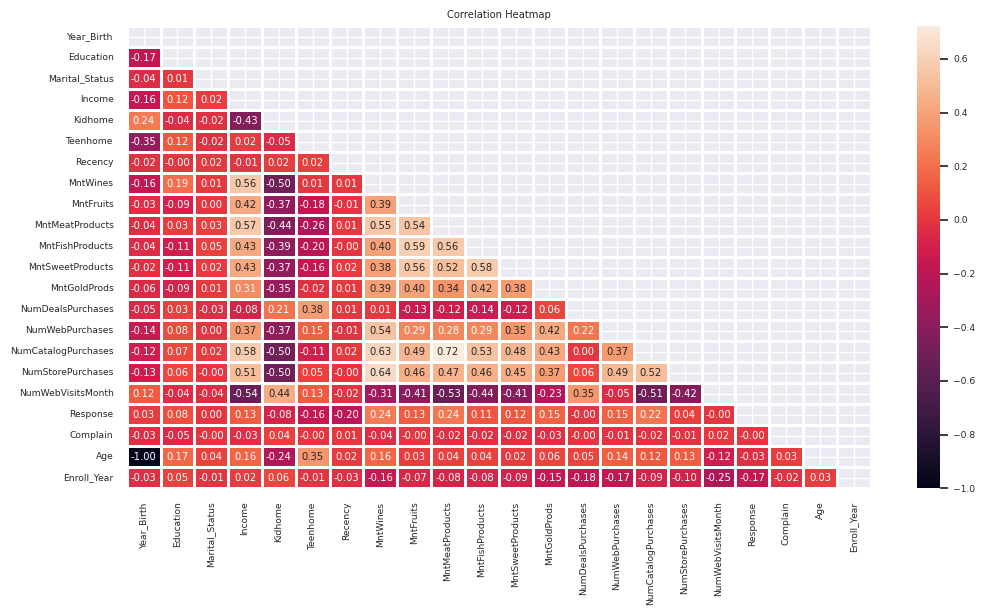

In [208]:
plt.figure(dpi = None,figsize= (12,6))
mask = np.triu(np.ones_like(df.corr(),dtype = bool))
sns.set(font_scale=0.6)

sns.heatmap(df.corr(),mask = mask, fmt = ".2f",annot=True ,lw=1,cmap = None)
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

Como conclusión de este Heatmap, se puede observar lo que ya era evidente cuando aplicamos  método .corr: no hay ninguna correlación significativa entre alguna variable en particular y la target. La mayor correlación ( aunque no significativa) la tienen: MntWines (la cantidad gastada en vinos en los últimos 2 años) **0,25**, MntMeatsProducts (la cantidad gastada en productos cárnicos en los últimos 2 años) **0.24** y NumCatalogPurchases ( cantidad de compras con descuento hechas por catálogo para ser enviadas por correo) **0.22**.
Ahora bien, podemos observar otras correlaciones que se dan, sin tener en cuenta la variable target. Ejemplo: correlación entre MntMeatsProducts y NumCatalogPurchases del **0.72** , correlación entre NumCatalogPurchases y NumStoregPurchases con MntWines del **0.64**.


Entonces, considero que, si bien, al tener definida una variable Target binaria en el Dataset debería pensar en aplicar un Modelo de Aprendizaje Supervisado de Clasificación como Random Forest Classifier, por ejemplo; al tener desbalanceada la target,tal vez deba probar con algunas técnicas para balancearla y al mismo tiempo aplicar algún Modelo de Aprendizaje No supervizado ( Clustering o Asociación) que me pueden ser útiles para detectar segmentos de clientes y aplicarnos inclusive luego al modelo incial. Esto es una primera consideración pensando en el modelo a aplicar.




---



**7. Modelo Predictivo**

7.2. Características relevantes

 Seleccionar un método de feature selection para reducir la dimensionalidad del dataset:
Para comenzar con este punto, en principio  hay algunas variables o features que podría eliminar o sacar considerando a simple visa que no me suman información o no tienen peso en el Dataset: Id del cliente , Dt Customer y
 'Year_Birth'(considerando que agregué una columna de Age en base a este dato).
Y al mismo tiempo, convertir las variables categóricas 'Education' y 'Marital_Status' ( esto se hizo en el punto anterior pare crear el Heatmap).

In [209]:
# Entonces, para analizar qué columnas quedan en el Dataset
df.columns

Index(['Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome',
       'Teenhome', 'Dt_Customer', 'Recency', 'MntWines', 'MntFruits',
       'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts',
       'MntGoldProds', 'NumDealsPurchases', 'NumWebPurchases',
       'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth',
       'Response', 'Complain', 'Age', 'Enroll_Year'],
      dtype='object')

In [210]:
df1=df.drop(['Year_Birth','Dt_Customer'],axis=1)
df1.head(10)

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain,Age,Enroll_Year
Id,,,,,,,,,,,,,,,,,,,,,
1826,2,0,84835,0,0,0,189,104,379,111,...,218,1,4,4,6,1,1,0,53,2014
1,2,2,57091,0,0,0,464,5,64,7,...,37,1,7,3,7,5,1,0,62,2014
10476,2,1,67267,0,1,0,134,11,59,15,...,30,1,3,2,5,2,0,0,65,2014
1386,2,3,32474,1,1,0,10,0,1,0,...,0,1,1,0,2,7,0,0,56,2014
5371,2,2,21474,1,0,0,6,16,24,11,...,34,2,3,1,2,7,1,0,34,2014
7348,4,2,71691,0,0,0,336,130,411,240,...,43,1,4,7,5,2,1,0,65,2014
4073,0,1,63564,0,0,0,769,80,252,15,...,65,1,10,10,7,6,1,0,69,2014
1991,2,3,44931,0,1,0,78,0,11,0,...,7,1,2,1,3,5,0,0,56,2014
4047,4,1,65324,0,1,0,384,0,102,21,...,5,3,6,2,9,4,0,0,69,2014


Como se vió y analizó tanto con el método .corr com con el Heatmap, no hay una correlación significativa de ninguna feature con la target Response. Y al mismo tiempo ya se mencionó previamente que la Target está desbalanceada (15%: 1 y 85%: 0). Entonces, podría utilizar el método **Forward Selection**, justamente para detectar cuáles serían las características relevantes:



In [211]:
columns_names= df1.columns
X =df1.drop("Response", 1)       # feature matrix
y =df1['Response']               # target feature
df1.head(10).head()

<ipython-input-211-26e76937859c>:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  X =df1.drop("Response", 1)       # feature matrix


,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Complain,Age,Enroll_Year
Id,,,,,,,,,,,,,,,,,,,,,
1826,2,0,84835,0,0,0,189,104,379,111,...,218,1,4,4,6,1,1,0,53,2014
1,2,2,57091,0,0,0,464,5,64,7,...,37,1,7,3,7,5,1,0,62,2014
10476,2,1,67267,0,1,0,134,11,59,15,...,30,1,3,2,5,2,0,0,65,2014
1386,2,3,32474,1,1,0,10,0,1,0,...,0,1,1,0,2,7,0,0,56,2014
5371,2,2,21474,1,0,0,6,16,24,11,...,34,2,3,1,2,7,1,0,34,2014


In [212]:
X

,Education,Marital_Status,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Complain,Age,Enroll_Year
Id,,,,,,,,,,,,,,,,,,,,
1826,2,0,84835,0,0,0,189,104,379,111,189,218,1,4,4,6,1,0,53,2014
1,2,2,57091,0,0,0,464,5,64,7,0,37,1,7,3,7,5,0,62,2014
10476,2,1,67267,0,1,0,134,11,59,15,2,30,1,3,2,5,2,0,65,2014
1386,2,3,32474,1,1,0,10,0,1,0,0,0,1,1,0,2,7,0,56,2014
5371,2,2,21474,1,0,0,6,16,24,11,0,34,2,3,1,2,7,0,34,2014
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10142,4,0,66476,0,1,99,372,18,126,47,48,78,2,5,2,11,4,0,47,2013
5263,0,1,31056,1,0,99,5,10,13,3,8,16,1,1,0,3,8,0,46,2013
22,2,0,46310,1,0,99,185,2,88,15,5,14,2,6,1,5,8,0,47,2012


In [213]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2058 entries, 1826 to 4070
Data columns (total 20 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   Education            2058 non-null   int64
 1   Marital_Status       2058 non-null   int64
 2   Income               2058 non-null   int64
 3   Kidhome              2058 non-null   int64
 4   Teenhome             2058 non-null   int64
 5   Recency              2058 non-null   int64
 6   MntWines             2058 non-null   int64
 7   MntFruits            2058 non-null   int64
 8   MntMeatProducts      2058 non-null   int64
 9   MntFishProducts      2058 non-null   int64
 10  MntSweetProducts     2058 non-null   int64
 11  MntGoldProds         2058 non-null   int64
 12  NumDealsPurchases    2058 non-null   int64
 13  NumWebPurchases      2058 non-null   int64
 14  NumCatalogPurchases  2058 non-null   int64
 15  NumStorePurchases    2058 non-null   int64
 16  NumWebVisitsMonth    

In [214]:
import sys
import joblib
sys.modules['sklearn.externals.joblib'] = joblib

In [215]:
import statsmodels.api as sm
def forward_selection(data_encoded, Response, significance_level=0.01):
    initial_features = data_encoded.columns.tolist()
    best_features = []
    while (len(initial_features)>0):
        remaining_features = list(set(initial_features)-set(best_features))
        new_pval = pd.Series(index=remaining_features)
        for new_column in remaining_features:
            model = sm.OLS(Response, sm.add_constant(data_encoded[best_features+[new_column]])).fit()
            new_pval[new_column] = model.pvalues[new_column]
        min_p_value = new_pval.min()
        if(min_p_value<significance_level):
            best_features.append(new_pval.idxmin())
        else:
            break
    return best_features

In [216]:
forward_selection(X,y)

<ipython-input-215-a11f3b3946e2>:7: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=remaining_features)
<ipython-input-215-a11f3b3946e2>:7: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=remaining_features)
<ipython-input-215-a11f3b3946e2>:7: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=remaining_features)
<ipython-input-215-a11f3b3946e2>:7: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  new_pval = pd.Series(index=remaining_features)
<ipython-input-2

['MntWines',
 'Recency',
 'Teenhome',
 'NumStorePurchases',
 'Enroll_Year',
 'MntMeatProducts',
 'NumWebPurchases',
 'Education',
 'MntGoldProds',
 'NumWebVisitsMonth']

Conclusión sobre el método de feature selection:

Según este método, son 10 las features seleccionadas  como las más relevantes:
 'MntWines',
 'Recency',
 'NumStorePurchases',
 'MntMeatProducts',
 'NumWebVisitsMonth',
 'Teenhome',
 'NumCatalogPurchases',
 'NumWebPurchases'
 'Education',
 'MntGoldProds'.
 Entonces, pruebo primero, aplicar el algoritmo seleccionado con estas 10 feauters.



---



7.2. Modelo de Predicción

Llamaré dfFS al nuevo Data Frame que incluye sólo estas 9 variables.

In [217]:
dfFS=df1.drop(['Marital_Status','Kidhome','Income','MntFruits','Age','MntFishProducts','MntSweetProducts','NumDealsPurchases','Complain'],axis=1)
dfFS.head(10)

,Education,Teenhome,Recency,MntWines,MntMeatProducts,MntGoldProds,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,NumWebVisitsMonth,Response,Enroll_Year
Id,,,,,,,,,,,,
1826,2,0,0,189,379,218,4,4,6,1,1,2014
1,2,0,0,464,64,37,7,3,7,5,1,2014
10476,2,1,0,134,59,30,3,2,5,2,0,2014
1386,2,1,0,10,1,0,1,0,2,7,0,2014
5371,2,0,0,6,24,34,3,1,2,7,1,2014
7348,4,0,0,336,411,43,4,7,5,2,1,2014
4073,0,0,0,769,252,65,10,10,7,6,1,2014
1991,2,1,0,78,11,7,2,1,3,5,0,2014
4047,4,1,0,384,102,5,6,2,9,4,0,2014


2) Aplicaré el algoritmo Random Forest Classifier, considerando las variables seleccionadas con el método Fordward Selection.

In [218]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn import metrics
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
sns.set_style('whitegrid')

In [219]:
X = dfFS.drop(['Response'],axis=1)
y = dfFS['Response']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=1)

modelo = RandomForestClassifier(random_state=1)
modelo.fit(X_train, y_train)

preds = modelo.predict(X_test)

<Figure size 500x400 with 0 Axes>

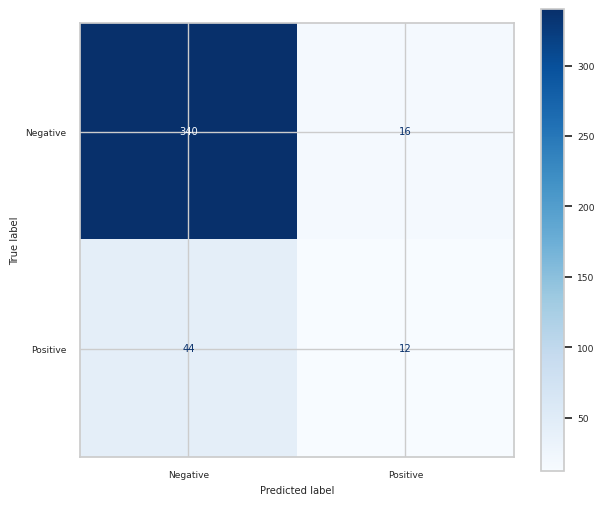

In [220]:
plt.figure(figsize=(5,4))
cm = confusion_matrix(y_test, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['Negative', 'Positive'])
disp = disp.plot(cmap="Blues")
plt.show()

3) Métricas para validar el modelo:

In [221]:
print(metrics.classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.89      0.96      0.92       356
           1       0.43      0.21      0.29        56

    accuracy                           0.85       412
   macro avg       0.66      0.58      0.60       412
weighted avg       0.82      0.85      0.83       412



Ahora aplicaré directamente el algortimo RFC , sin considerar las variables o features seleccionadas con el método Forward Selection.

In [222]:

X = df1.drop('Response',axis=1)
y = df1['Response']

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, random_state=1)

modelo = RandomForestClassifier (random_state=1)
modelo.fit(X_train, y_train)

preds = modelo.predict(X_test)

In [223]:
modelo.feature_importances_

array([0.02623153, 0.03370305, 0.08912469, 0.00757009, 0.01739336,
       0.1016307 , 0.10439826, 0.0485941 , 0.09436978, 0.05042101,
       0.04928007, 0.07501335, 0.03407028, 0.03516699, 0.04657519,
       0.04833158, 0.04689036, 0.00108805, 0.06012605, 0.0300215 ])

In [224]:
X.columns

Index(['Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome',
       'Recency', 'MntWines', 'MntFruits', 'MntMeatProducts',
       'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
       'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
       'NumStorePurchases', 'NumWebVisitsMonth', 'Complain', 'Age',
       'Enroll_Year'],
      dtype='object')

<Figure size 500x400 with 0 Axes>

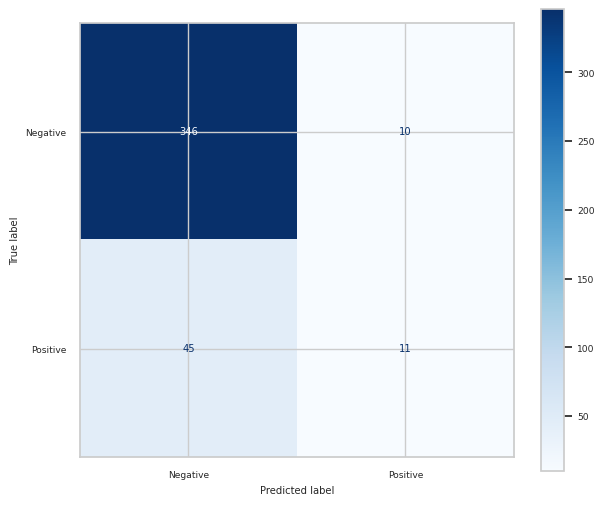

In [225]:
plt.figure(figsize=(5,4))
cm = confusion_matrix(y_test, preds)
disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=['Negative', 'Positive'])
disp = disp.plot(cmap="Blues")
plt.show()


**3)** Cálculo de métricas para validar el modelo:  se aplican las métricas y se concluye al final

In [226]:
print(metrics.classification_report(y_test, preds))

              precision    recall  f1-score   support

           0       0.88      0.97      0.93       356
           1       0.52      0.20      0.29        56

    accuracy                           0.87       412
   macro avg       0.70      0.58      0.61       412
weighted avg       0.84      0.87      0.84       412





---



**8. Conclusiones**

 Analizando el algoritmo seleccionado, utilizando las variables tanto del Forward selection como todas la variables, las métricas no varían mucho.
Haré las conclusiones a pirma facie, con las métricas de la 2da. opción.

Precisión: La precisión es la proporción de predicciones positivas correctas (verdaderos positivos) sobre el total de predicciones positivas (verdaderos positivos + falsos positivos). En este caso, la precisión para la clase 0 es del 88% y para la clase 1 es del 50%. Esto indica que el modelo tiene una alta precisión en predecir la clase 0 (mayoría, los que no aceptarán la oferta) y una menor precisión en predecir la clase 1 (minoría, los que sí aceptarán la oferta).

Recall: El recall es la proporción de instancias positivas correctamente clasificadas (verdaderos positivos) sobre el total de instancias positivas (verdaderos positivos + falsos negativos). Aquí, el recall para la clase 0 es del 97%, lo cual indica que el modelo tiene una alta capacidad para detectar instancias de la clase 0. Sin embargo, el recall para la clase 1 es del 16%, lo cual sugiere que el modelo tiene dificultades para identificar instancias de la clase 1, o sea, tiene dificultades para detectar justamente lo que se busca, que es quiénes van a aceptar la oferta.

F1-score: El F1-score es una medida que combina la precisión y el recall en un solo valor, proporcionando una métrica global del rendimiento del modelo. Es útil cuando hay un desequilibrio en las clases. Aquí, el F1-score para la clase 0 es del 93%, indicando un buen equilibrio entre precisión y recall. Sin embargo, el F1-score para la clase 1 es del 24%, lo que sugiere que hay un desequilibrio entre precisión y recall para esta clase.

Además de estas métricas, se proporcionan otras medidas como el accuracy (exactitud) que muestra la proporción de predicciones correctas sobre el total de instancias. En este caso, el accuracy es del 87%, lo cual indica que el modelo tiene un rendimiento general aceptable en la clasificación.

En general, estos resultados sugieren que el modelo RandomForestClassifier es eficaz en la clasificación de la clase mayoritaria (clase 0) con alta precisión y recall. Sin embargo, muestra un rendimiento más bajo en la clasificación de la clase minoritaria (clase 1) con una menor precisión y recall. Considero que esto puede deberse al desbalanceo de la variable target, entre otros factores.







**Respecto al Desafío complementario:**

Generar una evaluación de modelos apropiados para el problema de interés
Identificar por medio de las métricas generadas si se puede tener una situación de overfitting (sobreajuste) o underfitting (subajuste), discutiendo posibles formas de mejora.

Considerando el ùnico modelo que he podido aplicar Random Forest Classifier, en principio, analizando las métricas, dado que el modelo muestra una precisión y un F1-score más bajos para la clase 1, que serían justamente los que se quieren detectar, y un recall más bajo en general para la clase 1, esto puede indicar que el modelo está teniendo dificultades para obtener correctamente las instancias de la clase minoritaria. Esto podría ser un indicio de underfitting, lo que significa que el modelo no se ajusta lo suficientemente bien a los datos y no puede capturar la complejidad de los patrones en la clase minoritaria.

Posibles soluciones para este posible problema de underfitting:

Ajustar los hiperparámetros del modelo: Podría realizar una búsqueda de hiperparámetros para encontrar la combinación óptima que mejore el rendimiento del modelo. Por ejemplo, en Random Forest, podrìa  ajustar el número de árboles, la profundidad máxima de los árboles o el número mínimo de muestras requeridas para dividir un nodo.


Realizar ingeniería de características: Podrìa eventualmente crear nuevas características a partir de las existentes o aplicar transformaciones para mejorar la representación de los datos.

Balancear las clases: La clase minoritaria está desbalanceada en términos de número de instancias,tal como se viene mencionand. Podrìa aplicar técnicas de balanceo de clases, como submuestreo o sobremuestreo, para equilibrar la distribución de las clases y ayudar al modelo a aprender mejor de la clase minoritaria.( esto se mencionó en clase pero no se ha profundizado aún).